<div style="background-color:#ffb770   ;padding:5px;border-radius:10px;border:10px solid #a3a3a3;color:#000000  ;text-align:center; font-weight: 1000; font-family: Babas; font-size: 3.0em;">
<p style="text-align:center;" > Automatic categorisation of stack overflow questions  |Modelling</p>
    
<p style="text-align:center;" ><img src="https://www.silicon.fr/wp-content/uploads/2019/08/stack_overflow.jpg"   width="400" height="250"/></p>
</div>

<a id="IR"></a>


 <h1 style="background-color:#ffb770 ;padding:20px;border-radius:10px;border:10px solid #a3a3a3;font-weight: 1000;color:#000000;text-align:center; font-size: 2.0em" >Import libraries and data</h1>


<a id="imp"></a>
## <span style="color:#763d05;  font-weight: 1000;font-size: 1.0em"> Import libraries </span>

In [ ]:
!pip install contractions
!pip install optuna
!pip install umap-learn
!pip install hydra-core
!pip install omegaconf
!pip install bitarray
#!pip install --upgrade torch
#!pip install --upgrade transformers

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 289.9/289.9 kB 6.7 MB/s eta 0:00:0000:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 110.8/110.8 kB 10.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 2.9 MB/s eta 0:00:0000:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 9.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 7.2 MB/s eta 0:00:00
  Created wheel for antlr4-python3-runtime: filename=antlr4_python3_runtime-4.9.3-py3-none-any.whl size=144574 sha256=94aacb3afe72063f1744747cda0f0c160d109c67139b74b37504ba499d89b0df
  Stored in directory: /root/.cache/pip/wheels/12/93/dd/1f6a127edc45659556564c5730f6d4e300888f4bca2d4c5a88
Successfully built antlr4-python3-runtime


In [ ]:

#builtin
import os, sys, time, random

import os
for dirname, _, filenames in os.walk('/kaggle/input/stack-overflow'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

#data
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt

import re 

from bs4 import BeautifulSoup
import unicodedata
import contractions
import nltk

import string
from nltk.stem import WordNetLemmatizer 

from nltk.corpus import words, stopwords
from wordcloud import WordCloud

from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer,TfidfVectorizer

import plotly.express as px
import plotly.graph_objects as go

from tqdm.notebook import tqdm
tqdm.pandas()

# Target encodery
from sklearn.preprocessing import MultiLabelBinarizer
import tensorflow as tf
import warnings
warnings.filterwarnings("ignore")

In [ ]:
# download

nltk.download('omw-1.4')
nltk.download('wordnet')
nltk.download('stopwords')
nltk.download('words')
nltk.download('punkt')


In [ ]:
sns.set()

In [ ]:
stopwords = nltk.corpus.stopwords.words('english')

In [ ]:
DEBUG =False

<a id="imp"></a>
## <span style="font-weight: 1000;font-size: 1.0em"> Data loading and reading </span>

In [ ]:
#df = pd.read_csv("./data/clean_data/data_cleaned.csv")
df = pd.read_pickle("/kaggle/input/stack-overflow/data_cleaned.pkl")

if DEBUG == True:
    df = df.head(1000)

In [ ]:
X_train = pd.read_pickle('/kaggle/input/stack-overflow/X_train.pkl')
X_test = pd.read_pickle('/kaggle/input/stack-overflow/X_test.pkl')
Y_train = pd.read_pickle('/kaggle/input/stack-overflow/Y_train.pkl')
Y_test = pd.read_pickle('/kaggle/input/stack-overflow/Y_test.pkl')

In [ ]:
mlb = MultiLabelBinarizer()
#mlb.fit(Y_train)
y_train_mlb = mlb.fit_transform(Y_train)
y_test_mlb = mlb.transform(Y_test)
tags = mlb.classes_

In [ ]:
# Classifiers
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import LinearSVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import PassiveAggressiveClassifier
from sklearn.ensemble import ExtraTreesClassifier
from xgboost import XGBClassifier
from sklearn.linear_model import SGDClassifier
from sklearn.linear_model import LogisticRegression, RidgeClassifier, Perceptron, SGDOneClassSVM
from sklearn.naive_bayes import MultinomialNB
from sklearn.multiclass import OneVsRestClassifier
from sklearn.multioutput import MultiOutputClassifier
import lightgbm as lgb
from lightgbm import LGBMClassifier

# Metrics
from sklearn.metrics import precision_recall_fscore_support as score
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, accuracy_score, jaccard_score, make_scorer, hamming_loss
from sklearn.model_selection import cross_val_score

# Fine tuning

from hyperopt import fmin, tpe, hp, Trials
import optuna

from typing import Dict, Any, Tuple

<a id="imp"></a>
## <span style="font-weight: 1000;font-size: 1.0em"> Word2Vec Embedding</span>

In [ ]:
import warnings
warnings.filterwarnings("ignore")

In [ ]:
import gensim
gensim.__version__

In [ ]:
x_train = X_train["Title"] + " " + X_train["Body"]
x_test = X_test["Title"] + " " + X_test["Body"]

In [14]:
from gensim.utils import simple_preprocess
X_train_p = x_train.apply(lambda x: simple_preprocess(x, deacc=True))

In [15]:
from gensim.test.utils import common_texts
from gensim.models import Word2Vec

model_W2V = Word2Vec(sentences=X_train_p,window=5, min_count=1, vector_size=1000, workers=4)
#model_W2V.train(X_train, total_examples=len(X_train), epochs=50)

In [16]:
model_W2V.save('/kaggle/working/text_w2v_100_2_full.bin')

In [17]:
model = Word2Vec.load('/kaggle/working/text_w2v_100_2_full.bin')

In [20]:
from gensim.models import Word2Vec, FastText

model_path = '/kaggle/working/'
model_prefix = 'text'

param_grid = {'w2v': {'variant': ['cbow', 'sg'], 'window': [2, 5, 30]},
              'ft': {'variant': ['sg'], 'window': [5]}}
size = 100

for algo, params in param_grid.items(): 
    print(algo) ###
    for variant in params['variant']:
        sg = 1 if variant == 'sg' else 0
        for window in params['window']:
            print(f"  Variant: {variant}, Window: {window}, Size: {size}") ###
            np.random.seed(42) ### to ensure repeatability
            if algo == 'w2v':
                model = Word2Vec(X_train_p, vector_size=size, window=window, sg=sg)
            else:
                model = FastText(X_train_p, vector_size=size, window=window, sg=sg)

            file_name = f"{model_path}/{model_prefix}_{algo}_{variant}_{window}"
            model.wv.save_word2vec_format(file_name + '.bin', binary=True)

w2v
  Variant: cbow, Window: 2, Size: 100
  Variant: cbow, Window: 5, Size: 100
  Variant: cbow, Window: 30, Size: 100
  Variant: sg, Window: 2, Size: 100
  Variant: sg, Window: 5, Size: 100
  Variant: sg, Window: 30, Size: 100
ft
  Variant: sg, Window: 5, Size: 100


In [21]:
from gensim.models import KeyedVectors
model_path = '/kaggle/working/' ###

names = ['text_w2v_cbow_2', 'text_w2v_sg_2', 
         'text_w2v_sg_5', 'text_w2v_sg_30', 'text_ft_sg_5']
models = {}

for name in names:
    file_name = f"{model_path}/{name}.bin"
    print(f"Loading {file_name}") ###
    models[name] = KeyedVectors.load_word2vec_format(file_name, binary=True)

Loading /kaggle/working//text_w2v_cbow_2.bin
Loading /kaggle/working//text_w2v_sg_2.bin
Loading /kaggle/working//text_w2v_sg_5.bin
Loading /kaggle/working//text_w2v_sg_30.bin
Loading /kaggle/working//text_ft_sg_5.bin


In [22]:
import pandas as pd
from typing import Dict, Any
from gensim.models import KeyedVectors

def compare_models(models: Dict[str, KeyedVectors], **kwargs: Any) -> pd.DataFrame:
    """
    Compare word similarity scores between different models.

    Args:
        models: A dictionary of model names and their corresponding KeyedVectors models.
        **kwargs: Additional keyword arguments to be passed to the `most_similar` method.

    Returns:
        df: A DataFrame comparing word similarity scores between different models.
    """
    df = pd.DataFrame()
    for name, model in models.items():
        df[name] = [f"{word} {score:.3f}" for word, score in model.most_similar(**kwargs)]
    df.index = df.index + 1  # Let row index start at 1
    return df


In [23]:
compare_models([(n, models[n]) for n in names], positive='python', topn=10)

,text_w2v_cbow_2,text_w2v_sg_2,text_w2v_sg_5,text_w2v_sg_30,text_ft_sg_5
1,matlab 0.689,setuptools 0.737,pypy 0.761,py 0.842,pythons 0.936
2,perl 0.670,pypy 0.725,anaconda 0.759,traceback 0.732,wxpython 0.901
3,lua 0.611,anaconda 0.718,scapy 0.734,importerror 0.723,cpython 0.899
4,opencv 0.599,perl 0.717,spyder 0.731,emilychen 0.722,ipython 0.889
5,jupyter 0.590,distutils 0.709,snappy 0.728,console_scripts 0.717,winpython 0.882
6,ipython 0.588,jupyter 0.696,pylint 0.726,ems 0.717,python_ 0.861
7,tensorflow 0.583,nose 0.695,kernels 0.722,recent 0.712,pythonic 0.857
8,haskell 0.578,flake 0.693,programme 0.716,scapy 0.705,jython 0.854
9,pip 0.573,scapy 0.689,setuptools 0.715,enthought 0.703,ironpython 0.845
10,notebook 0.571,spyder 0.689,cauchy 0.714,systemerror 0.701,pypy 0.835


In [24]:
compare_models([(n, models[n]) for n in names], 
               positive=['java', 'html'], negative=['javascript'], topn=5).T

,1,2,3,4,5
text_w2v_cbow_2,componentscan 0.472,groovy 0.463,kt 0.454,basepackages 0.451,androidruntime 0.449
text_w2v_sg_2,jav 0.492,confluence 0.490,methodrunner 0.490,lication 0.488,snakeyaml 0.488
text_w2v_sg_5,bookreview 0.596,jav 0.581,misha 0.575,happycoding 0.564,uiviewroot 0.544
text_w2v_sg_30,at 0.651,org 0.650,abstractrunmojo 0.612,httpconduit 0.609,streamwagon 0.609
text_ft_sg_5,jav 0.620,dorg 0.598,javaee 0.584,org 0.576,doas 0.576


In [25]:
# try a different analogy
compare_models([(n, models[n]) for n in names], 
               positive=['javascript', 'python'], negative=['java'], topn=5).T

,1,2,3,4,5
text_w2v_cbow_2,perl 0.555,jquery 0.550,matlab 0.543,rails 0.533,built 0.519
text_w2v_sg_2,perl 0.575,lua 0.568,haml 0.559,greasemonkey 0.554,grammar 0.545
text_w2v_sg_5,preferrably 0.570,greasemonkey 0.569,bookmarklet 0.567,perl 0.564,jinja 0.547
text_w2v_sg_30,greasemonkey 0.600,pisa 0.576,xul 0.576,vml 0.545,scraping 0.539
text_ft_sg_5,osascript 0.712,ecmascript 0.652,wxpython 0.632,pythonic 0.627,cpython 0.616


In [26]:
# and another one
compare_models([(n, models[n]) for n in names], 
               positive=['python'], negative=[], topn=5)

,text_w2v_cbow_2,text_w2v_sg_2,text_w2v_sg_5,text_w2v_sg_30,text_ft_sg_5
1,matlab 0.689,setuptools 0.737,pypy 0.761,py 0.842,pythons 0.936
2,perl 0.670,pypy 0.725,anaconda 0.759,traceback 0.732,wxpython 0.901
3,lua 0.611,anaconda 0.718,scapy 0.734,importerror 0.723,cpython 0.899
4,opencv 0.599,perl 0.717,spyder 0.731,emilychen 0.722,ipython 0.889
5,jupyter 0.590,distutils 0.709,snappy 0.728,console_scripts 0.717,winpython 0.882


In [27]:
from umap import UMAP

model = models['text_w2v_sg_30']
words = model.index_to_key # words in vocabulary
wv = [model[word] for word in words]

reducer = UMAP(n_components=2, metric='cosine', n_neighbors = 15, min_dist=0.1, random_state = 12)
reduced_wv = reducer.fit_transform(wv)

In [28]:
import plotly.express as px
px.defaults.template = "plotly_white" ### plotly style

plot_df = pd.DataFrame.from_records(reduced_wv, columns=['x', 'y'])
plot_df['word'] = words
params = {'hover_data': {c: False for c in plot_df.columns}, 
          'hover_name': 'word'}
params.update({'width': 800, 'height': 600}) ###

fig = px.scatter(plot_df, x="x", y="y", opacity=0.3, size_max=3, **params)
fig.update_traces(marker={'line': {'width': 0}}) ###
fig.update_xaxes(showticklabels=False, showgrid=True, zeroline=False, visible=True) ###
fig.update_yaxes(showticklabels=False, showgrid=True, zeroline=False, visible=True) ###
fig.show()

In [29]:
import pandas as pd
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from umap import UMAP
import plotly.express as px
import plotly.graph_objs as go
from typing import List, Union, Optional
import numpy as np

def plot_embeddings(model, search: List[str] = [], topn: int = 0, show_all: bool = False, train_all: bool = False,
                    labels: bool = False, colors: bool = True, n_dims: int = 2, algo: str = 'pca', **kwargs) -> go.Figure:
    """
    Plot word embeddings in a lower-dimensional space.

    Args:
        model: Word embedding model.
        search: List of words to search for.
        topn: Number of similar words to consider for each search word.
        show_all: Boolean flag indicating whether to show all words or only the search words.
        train_all: Boolean flag indicating whether to train the dimensionality reduction algorithm on all words or only the search words.
        labels: Boolean flag indicating whether to show labels for the search words.
        colors: Boolean flag indicating whether to colorize the points based on the closest search word.
        n_dims: Number of dimensions for the lower-dimensional space.
        algo: Algorithm to use for dimensionality reduction ('pca', 'tsne', or 'umap').

    Returns:
        fig: Plotly figure object.
    """

    def closest(word: str, model, search: List[str], topn: int) -> Union[str, 'np.ndarray']:
        """Find the closest word in a given list of search words, if in top-n."""
        closest_word = model.most_similar_to_given(word, search)
        if word == closest_word or word in [w for w, _ in model.most_similar(closest_word, topn=topn)]:
            return closest_word
        else:
            return 'other'

    # Eliminate kwargs of other methods if supplied
    if algo != 'tsne':
        kwargs.pop('perplexity', None)
    if algo != 'umap':
        kwargs.pop('n_neighbors', None)
        kwargs.pop('min_dist', None)
        kwargs.pop('spread', None)

    # Define the reducer
    if algo == 'umap':
        reducer = UMAP(n_components=n_dims, metric='cosine', **kwargs)
    elif algo == 'tsne':
        reducer = TSNE(n_components=n_dims, **kwargs)
    else:
        reducer = PCA(n_components=n_dims, **kwargs)

    if len(search) == 0:  # No search words: show all
        show_all = True
    if show_all:  # To show all, all must be trained
        train_all = True

    # Identify words to plot
    if show_all:
        words = [w for w in model.index_to_key]
    else:
        words = search + [sim_word for w in search
                          for sim_word, _ in model.most_similar(w, topn=topn)]
        words = list(set(words))  # Make word list unique for t-SNE

    # Reduce
    wv = [model[word] for word in words]
    if not train_all:
        print(f"Calculating {algo} for {len(words)} words ...", end="")
        reduced_wv = reducer.fit_transform(wv)
    else:
        print(f"Calculating {algo} for {len(words)} words ...", end="")
        reducer.fit(model.vectors)
        reduced_wv = reducer.transform(wv)
    print(f" done.")

    # Create DataFrame for Plotly Express visualization with x, y (, z) and meta data for styling
    if n_dims == 2:
        df = pd.DataFrame.from_records(reduced_wv, columns=['x', 'y'])
    else:
        df = pd.DataFrame.from_records(reduced_wv, columns=['x', 'y', 'z'])

    df['word'] = words
    params = {}

    if show_all:
        df['size'] = 1
        params.update({'size_max': 3, 'size': 'size'})
    else:
        df['size'] = df['word'].map(lambda w: 30 if w in search else 5)
        params.update({'size': 'size'})

    if len(search) > 0:  # colorize with closest search word
        df['label'] = df['word'].map(lambda w: w if labels or w in search else '')
        params.update({'text': 'label'})
        if colors:
            df['color'] = df['word'].apply(closest, model=model, search=search, topn=topn)
            params.update({'color': 'color'})

    params.update({'hover_data': {c: False for c in df.columns}, 'hover_name': 'word'})

    # Generate scatter plot
    if n_dims == 2:
        params.update({'width': 1200, 'height': 700})
        fig = px.scatter(df, x="x", y="y", opacity=0.3, **params)
        fig.update_xaxes(showticklabels=False, showgrid=True, title='', zeroline=False, visible=True)
        fig.update_yaxes(showticklabels=False, showgrid=True, title='', zeroline=False, visible=True)
    else:
        params.update({'width': 1500, 'height': 1200})
        df['z'] = df['z']*2/3  # Scale 3D box
        fig = px.scatter_3d(df, x="x", y="y", z="z", opacity=0.5, **params)
        fig.update_layout(scene=dict(xaxis=go.layout.scene.XAxis(title='', showticklabels=False),
                                     yaxis=go.layout.scene.YAxis(title='', showticklabels=False),
                                     zaxis=go.layout.scene.ZAxis(title='', showticklabels=False)))
    fig.update_traces(textposition='middle center', marker={'line': {'width': 0}})
    fig.update_layout(font=dict(family="Franklin Gothic", size=12, color="#000000"))
    fig.show()
    return fig


In [30]:
#from blueprints.embeddings import plot_embeddings

model = models['text_w2v_sg_30'] ###
search = ['python', 'java', 'html', 'javascript', 'apache', 'linux', 'conda', 'code']

_ = plot_embeddings(model, search, topn=50, show_all=True, labels=False, 
                algo='umap', n_neighbors=15, min_dist=0.1, random_state=12)

Calculating umap for 33782 words ... done.


In [31]:
model = models['text_w2v_sg_30'] ###
search = ['python', 'java', 'html', 'javascript', 'apache', 'linux', 'net']

_ = plot_embeddings(model, search, topn=10, show_all=False, labels=True, 
    algo='umap', n_neighbors=15, min_dist=10, spread=25, random_state=7)



Calculating umap for 75 words ... done.


In [32]:
_ = plot_embeddings(model, search, topn=30, n_dims=3, 
    algo='umap', n_neighbors=15, min_dist=.1, spread=40, random_state=23)

Calculating umap for 210 words ... done.


In [33]:
model = models['text_w2v_sg_5'] 
search = ['python', 'java', 'html', 'javascript', 'apache', 'linux', 'net']
_ = plot_embeddings(model, search, topn=0, algo='pca', labels=True, colors=True)

Calculating pca for 7 words ... done.


In [34]:
import csv

model_path = '/kaggle/working/' ###
name = 'text_w2v_sg_30'
model = models[name]

with open(f'{model_path}/{name}_words.tsv', 'w', encoding='utf-8') as tsvfile:
    tsvfile.write('\n'.join(model.index_to_key))

with open(f'{model_path}/{name}_vecs.tsv', 'w', encoding='utf-8') as tsvfile:
    writer = csv.writer(tsvfile, delimiter='\t', 
                        dialect=csv.unix_dialect, quoting=csv.QUOTE_MINIMAL)
    for w in model.index_to_key:
        _ = writer.writerow(model[w].tolist())

In [35]:
import networkx as nx
from collections import deque
from typing import Any

def sim_tree(model: KeyedVectors, word: str, top_n: int, max_dist: int) -> nx.Graph:
    """
    Generate a similarity tree graph for a given word.

    Args:
        model: KeyedVectors model.
        word: Word to build the similarity tree from.
        top_n: Number of top similar words to consider.
        max_dist: Maximum distance (depth) to explore in the similarity tree.

    Returns:
        graph: NetworkX Graph representing the similarity tree.
    """
    graph = nx.Graph()
    graph.add_node(word, dist=0)

    to_visit = deque([word])
    while len(to_visit) > 0:
        source = to_visit.popleft()  # Visit the next node
        dist = graph.nodes[source]['dist'] + 1

        if dist <= max_dist:  # Discover new nodes
            for target, sim in model.most_similar(source, topn=top_n):
                if target not in graph:
                    to_visit.append(target)
                    graph.add_node(target, dist=dist)
                    graph.add_edge(source, target, sim=sim, dist=dist)
    return graph


In [36]:
from typing import Dict, Tuple

def plt_add_margin(pos: Dict[str, Tuple[float, float]], x_factor: float = 0.1, y_factor: float = 0.1) -> None:
    """
    Add margin to the plot based on the positions of nodes.

    Args:
        pos: Dictionary mapping node names to their positions (x, y).
        x_factor: Factor to determine the horizontal margin.
        y_factor: Factor to determine the vertical margin.
    """
    x_values, y_values = zip(*pos.values())
    x_max = max(x_values)
    x_min = min(x_values)
    y_max = max(y_values)
    y_min = min(y_values)

    x_margin = (x_max - x_min) * x_factor
    y_margin = (y_max - y_min) * y_factor

    plt.xlim(x_min - x_margin, x_max + x_margin)
    plt.ylim(y_min - y_margin, y_max + y_margin)

def scale_weights(graph: nx.Graph, minw: float = 1, maxw: float = 8) -> nx.Graph:
    """
    Scale edge weights (similarity scores) in the graph to a specified range.

    Args:
        graph: The input graph.
        minw: Minimum weight value for scaling.
        maxw: Maximum weight value for scaling.

    Returns:
        The graph with scaled edge weights.
    """
    sims = [graph[s][t]['sim'] for (s, t) in graph.edges]
    min_sim, max_sim = min(sims), max(sims)

    for source, target in graph.edges:
        sim = graph[source][target]['sim']
        graph[source][target]['sim'] = (sim - min_sim) / (max_sim - min_sim) * (maxw - minw) + minw

    return graph

def solve_graphviz_problems(graph: nx.Graph) -> nx.Graph:
    """
    Solve issues related to Graphviz when visualizing the graph.

    Args:
        graph: The input graph.

    Returns:
        A modified graph with node names cleaned to avoid Graphviz errors.
    """
    def clean(n: str) -> str:
        n = n.replace(',', '')
        n = n.encode().decode('ascii', errors='ignore')
        n = re.sub(r'[{}\[\]]', '-', n)
        n = re.sub(r'^\-', '', n)
        return n

    node_map = {n: clean(n) for n in graph.nodes}
    for n, m in node_map.items():
        if len(m) == 0:
            graph.remove_node(n)

    return nx.relabel_nodes(graph, node_map)

In [37]:
from networkx.drawing.nx_pydot import graphviz_layout

def plot_tree(graph: nx.Graph, node_size: int = 1000, font_size: int = 12) -> None:
    """
    Plot the similarity tree graph.

    Args:
        graph: The similarity tree graph.
        node_size: Size of the nodes in the plot.
        font_size: Font size for node labels in the plot.
    """
    graph = solve_graphviz_problems(graph)

    pos = graphviz_layout(graph, prog='twopi', root=list(graph.nodes)[0])
    plt.figure(figsize=(10, 4), dpi=200)
    plt.grid(b=None)
    plt.box(False)
    plt_add_margin(pos)

    colors = [graph.nodes[n]['dist'] for n in graph]  # Colorize nodes by distance
    nx.draw_networkx_nodes(graph, pos, node_size=node_size, node_color=colors,
                           cmap='Set1', alpha=0.4)
    nx.draw_networkx_labels(graph, pos, font_size=font_size)
    scale_weights(graph)
    
    for n1, n2, sim in graph.edges(data='sim'):
        nx.draw_networkx_edges(graph, pos, [(n1, n2)], width=sim, alpha=0.2)

    plt.show()

In [38]:
def plot_tree(graph: nx.Graph, node_size: int = 1000, font_size: int = 12) -> None:
    """
    Plot the similarity tree graph.

    Args:
        graph: The similarity tree graph.
        node_size: Size of the nodes in the plot.
        font_size: Font size for node labels in the plot.
    """
    graph = solve_graphviz_problems(graph)

    pos = graphviz_layout(graph, prog='twopi', root=list(graph.nodes)[0])
    plt.figure(figsize=(10, 4), dpi=200)
    plt.box(False)
    plt_add_margin(pos)

    colors = [graph.nodes[n]['dist'] for n in graph]  # Colorize nodes by distance
    nx.draw_networkx_nodes(graph, pos, node_size=node_size, node_color=colors,
                           cmap='Set1', alpha=0.4)
    nx.draw_networkx_labels(graph, pos, font_size=font_size)
    scale_weights(graph)
    
    for n1, n2, sim in graph.edges(data='sim'):
        nx.draw_networkx_edges(graph, pos, [(n1, n2)], width=sim, alpha=0.2)

    plt.show()

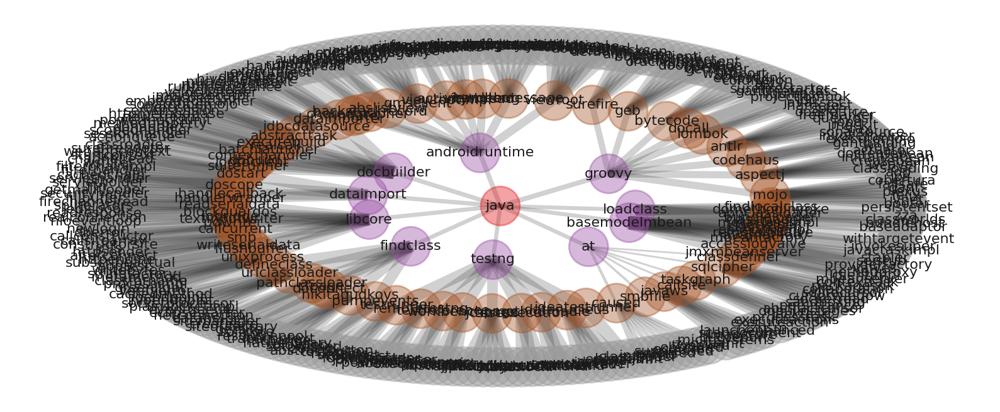

In [39]:
model = models['text_w2v_sg_2']
graph = sim_tree(model, 'java', top_n=10, max_dist=3)
plot_tree(graph, node_size=500, font_size=8)

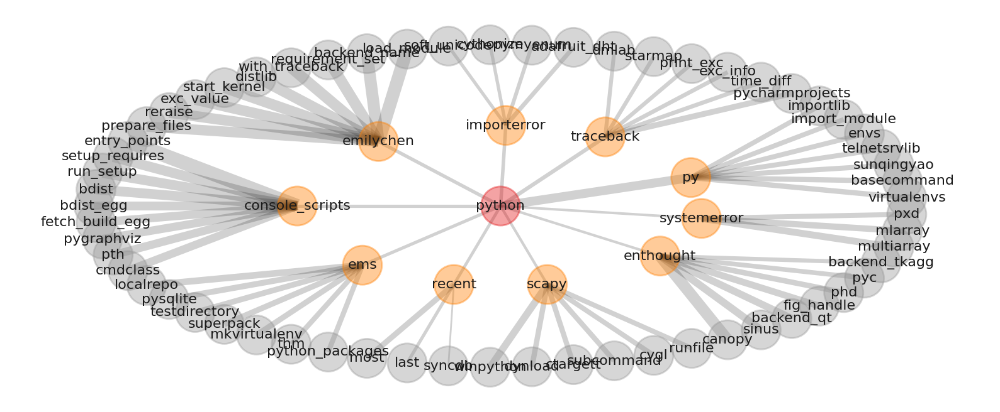

In [40]:
model = models['text_w2v_sg_30']
graph = sim_tree(model, 'python', top_n=10, max_dist=2)
plot_tree(graph, node_size=500, font_size=8)

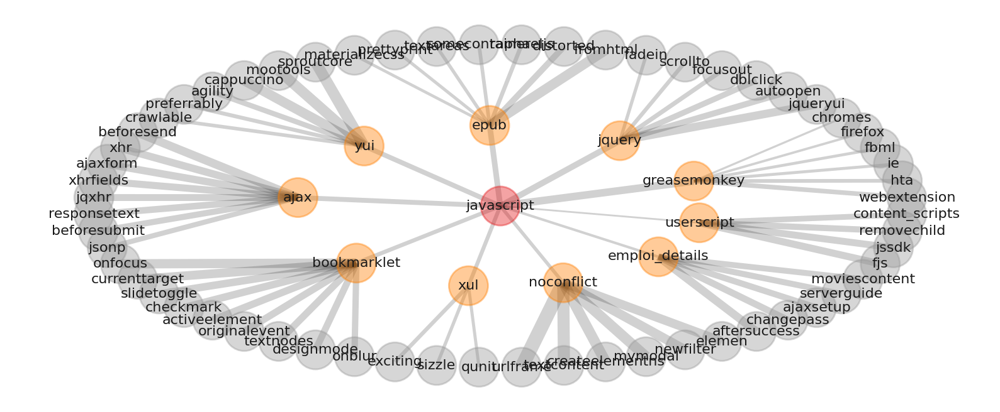

In [41]:
model = models['text_w2v_sg_30']
graph = sim_tree(model, 'javascript', top_n=10, max_dist=2)
plot_tree(graph, node_size=500, font_size=8)

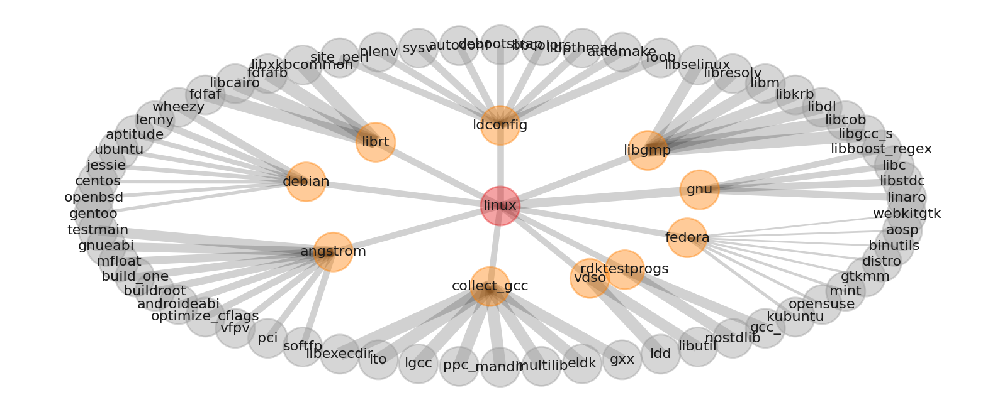

In [42]:
model = models['text_w2v_sg_30']
graph = sim_tree(model, 'linux', top_n=10, max_dist=2)
plot_tree(graph, node_size=500, font_size=8)

In [43]:
word_vectors = model_W2V.wv
model_W2V.wv.key_to_index
# Convert the word vectors to a dataframe
word_vectors_df = pd.DataFrame(word_vectors.vectors, index=word_vectors.index_to_key)

In [44]:
word_vectors.key_to_index

{'the': 0,
 'to': 1,
 'is': 2,
 'in': 3,
 'and': 4,
 'of': 5,
 'this': 6,
 'it': 7,
 'that': 8,
 'not': 9,
 'for': 10,
 'have': 11,
 'with': 12,
 'on': 13,
 'my': 14,
 'am': 15,
 'but': 16,
 'if': 17,
 'be': 18,
 'as': 19,
 'from': 20,
 'at': 21,
 'using': 22,
 'do': 23,
 'how': 24,
 'java': 25,
 'an': 26,
 'can': 27,
 'or': 28,
 'are': 29,
 'new': 30,
 'so': 31,
 'code': 32,
 'when': 33,
 'get': 34,
 'file': 35,
 'like': 36,
 'use': 37,
 'what': 38,
 'there': 39,
 'data': 40,
 'public': 41,
 'error': 42,
 'would': 43,
 'class': 44,
 'which': 45,
 'string': 46,
 'does': 47,
 'return': 48,
 'any': 49,
 'you': 50,
 'all': 51,
 'app': 52,
 'by': 53,
 'function': 54,
 'org': 55,
 'some': 56,
 'will': 57,
 'com': 58,
 'way': 59,
 'here': 60,
 'want': 61,
 'one': 62,
 'user': 63,
 'int': 64,
 'set': 65,
 'name': 66,
 'test': 67,
 'server': 68,
 'application': 69,
 'no': 70,
 'system': 71,
 'has': 72,
 'method': 73,
 'type': 74,
 'id': 75,
 'then': 76,
 'import': 77,
 'only': 78,
 'http': 79,

In [45]:
word_vectors["python"]

array([-8.43799353e-01,  4.77557749e-01, -8.82475257e-01,  3.33733857e-01,
        2.68366456e-01, -7.88559496e-01,  6.77964687e-01, -6.13442898e-01,
        1.79592639e-01,  2.93461114e-01, -8.25456798e-01, -4.93419200e-01,
       -3.97634506e-01, -8.51654887e-01, -3.93219620e-01, -2.77059853e-01,
        3.98765713e-01,  8.51330459e-02,  5.25823534e-01, -1.21354556e+00,
        5.31153679e-01,  2.29173452e-01,  4.21227425e-01, -3.06913674e-01,
        3.31125826e-01, -3.15836146e-02, -1.26173481e-01,  1.80502847e-01,
        9.44697931e-02, -2.11237818e-01, -8.23455930e-01, -5.48418641e-01,
       -1.69957411e-02, -9.99181151e-01,  2.97898680e-01,  6.55900016e-02,
       -3.94555092e-01, -1.47855848e-01, -1.27500743e-01,  7.38450646e-01,
        2.05250457e-01,  5.05999923e-01,  4.74165708e-01, -3.84915471e-01,
        6.23020232e-01,  4.14776713e-01, -6.81910574e-01, -1.88776702e-01,
       -1.16833754e-01, -7.83680286e-03,  9.33554992e-02, -7.19750524e-01,
        1.63087714e+00, -

In [46]:
word_vectors.most_similar('python')

[('notebook', 0.6083054542541504),
 ('anaconda', 0.6037576794624329),
 ('virtualenv', 0.5831324458122253),
 ('jupyter', 0.572507381439209),
 ('ipython', 0.5707096457481384),
 ('distutils', 0.5665395259857178),
 ('matlab', 0.5656930208206177),
 ('perl', 0.5634838342666626),
 ('pip', 0.5610947608947754),
 ('numpy', 0.5605116486549377)]

In [47]:
word_vectors.most_similar('javascript')

[('jquery', 0.7578901648521423),
 ('ajax', 0.6043444275856018),
 ('markup', 0.5767573118209839),
 ('html', 0.5765733122825623),
 ('css', 0.5736518502235413),
 ('angularjs', 0.5701931118965149),
 ('flash', 0.5336941480636597),
 ('dom', 0.5278565883636475),
 ('iframe', 0.5258526802062988),
 ('browser', 0.522524356842041)]

In [48]:
word_vectors.most_similar('java')

[('groovy', 0.6149044036865234),
 ('sun', 0.604266345500946),
 ('scala', 0.5605388879776001),
 ('detailsactivity', 0.5184621810913086),
 ('internal', 0.514729380607605),
 ('getmbean', 0.5117186307907104),
 ('runtime', 0.5091391205787659),
 ('impl', 0.49938300251960754),
 ('performmeasure', 0.4985125660896301),
 ('resumewith', 0.4983997046947479)]

In [49]:
word_vectors_df

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
the,-1.235711,-0.342824,0.172091,-0.120657,-0.125985,-0.585946,-0.003035,0.076647,0.578381,-0.556940,...,0.379005,-0.244575,0.094179,-0.191614,0.277234,-0.584021,0.077787,0.450669,0.775164,0.016711
to,-0.275761,0.752836,0.699641,-0.002407,-0.758154,-0.232411,-0.377486,1.145978,0.194926,-0.693404,...,0.402637,-0.547676,-0.052232,0.194159,0.057491,-0.435814,-0.400225,0.283238,0.078039,0.356670
is,-0.900746,-0.278303,0.092124,0.647109,0.788585,0.043057,0.150896,0.664727,0.129452,0.285339,...,-0.298315,0.244537,0.517320,0.102099,0.085479,0.920300,0.815530,-0.005743,-0.053473,0.107047
in,-0.620688,-0.361317,-0.153565,0.380200,0.271509,-0.180613,-0.599599,0.370553,0.807053,0.281552,...,-0.164434,0.075841,-0.540368,-0.156129,-0.035691,0.123748,-0.151498,0.091693,-0.223201,0.189804
and,-1.136728,-0.489982,0.038429,-1.074703,0.256171,-0.384558,-0.459487,0.022903,0.505366,-0.671158,...,-0.027190,-0.530365,-0.302886,-0.440607,0.220765,0.374063,-0.110313,0.788568,-0.138098,-0.031131
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
getswagger,0.008515,0.009749,0.012383,0.014710,-0.008594,-0.012428,0.002633,0.001465,-0.001516,0.006383,...,-0.008648,-0.001957,0.005034,-0.002862,0.003115,0.002933,-0.004788,-0.009256,0.006268,-0.008408
trysharpziplib,0.011806,-0.005982,0.003876,-0.001355,-0.001645,-0.000476,-0.013700,0.000842,0.001600,0.001687,...,0.001271,0.002182,0.003400,0.003598,0.003491,-0.001735,-0.003781,-0.001765,0.001000,0.001605
moshe,0.016460,-0.001410,0.008125,0.005088,-0.008474,0.006001,-0.000645,-0.000177,0.005138,-0.004123,...,-0.003549,-0.006317,0.010382,0.004261,-0.003933,-0.001161,-0.008288,0.001564,0.001698,0.000224
cleanname,0.015469,0.004716,0.003332,-0.002385,-0.008369,-0.001670,-0.006985,-0.001271,0.002065,0.007666,...,0.002376,-0.008656,0.004699,-0.005162,-0.001159,-0.004591,-0.003701,-0.008315,0.007661,-0.003392


In [50]:
# Access a specific word embedding
word_vector = word_vectors["python"]

### W2V ONEVSREST

In [51]:
from gensim.models import Word2Vec
from sklearn.multioutput import MultiOutputClassifier

# Tokenize the text and train Word2Vec
#corpus = [doc.split() for doc in df['text']]
# Tokenize the text and train Word2Vec
X_train_p = x_train.apply(lambda x: simple_preprocess(x, deacc=True))
X_test_p = x_test.apply(lambda x: simple_preprocess(x, deacc=True))
#corpus = [doc.split() for doc in X_train_p]
model = Word2Vec(X_train_p, vector_size=500, window=5, min_count=1, workers=4)



In [52]:
# Convert text to vectors
x_train_W2V = np.array([np.mean([model.wv[word] for word in doc.split() if word in model.wv] or [np.zeros(500)], axis=0) for doc in x_train])
x_test_W2V = np.array([np.mean([model.wv[word] for word in doc.split() if word in model.wv] or [np.zeros(500)], axis=0) for doc in x_test])
#w2v_model = Word2Vec.save('./models/model.bin')
#x_test_W2V = [model.wv[token] for token in test_corpus  if token in model.wv]
#w2v_model = Word2Vec.load('./models/model')

In [21]:
import sklearn.metrics as metrics
from sklearn.metrics import precision_recall_fscore_support as score
from typing import Dict, Any, Tuple


def modelling(models: Dict[str, Any], X_train: pd.DataFrame, X_test: pd.DataFrame,
              y_train: pd.DataFrame, y_test: pd.DataFrame) -> Dict[str, Dict[str, float]]:
    """
    Perform classification using multiple models and evaluate their performance.

    Args:
        models (Dict[str, Any]): A dictionary containing the names of the classifiers as keys and the corresponding
                                 classifier objects as values.
        X_train (pd.DataFrame): The training data features.
        X_test (pd.DataFrame): The testing data features.
        y_train (pd.DataFrame): The training data labels.
        y_test (pd.DataFrame): The testing data labels.

    Returns:
        Dict[str, Dict[str, float]]: A dictionary containing the evaluation scores for each classifier.

    """
    scores = {}
    for clf_name, classifier in models.items():
        print("*" * 89)
        print(f"{' ' * 38}{clf_name}")
        print("*" * 89)

        clf = OneVsRestClassifier(classifier)
        clf.fit(X_train, y_train)
        y_pred_train = clf.predict(X_train)
        y_pred = clf.predict(X_test)

        precision_train = precision_score(y_train, y_pred_train, average="micro")
        precision = precision_score(y_test, y_pred, average="micro")
        recall_train = recall_score(y_train, y_pred_train, average="micro")
        recall = recall_score(y_test, y_pred, average="micro")
        fscore_train = f1_score(y_train, y_pred_train, average="micro")
        fscore = f1_score(y_test, y_pred, average="micro")
        jaccard_train = jaccard_score(y_train, y_pred_train, average='samples')
        jaccard = jaccard_score(y_test, y_pred, average='samples')
        accuracy_train = accuracy_score(y_train, y_pred_train)
        accuracy = accuracy_score(y_test, y_pred)
        hamLoss_train = hamming_loss(y_train, y_pred_train)
        hamLoss = hamming_loss(y_test, y_pred)

        print(f"precision on train: {precision_train}, and test: {precision}")
        print(f"recall score on train: {recall_train}, and test: {recall}")
        print(f"fscore score on train: {fscore_train}, and test: {fscore}")
        print(f"Jaccard score on train: {jaccard_train}, and test: {jaccard}")
        print(f"Accuracy score on train: {accuracy_train}, and test: {accuracy}")
        print(f"Hamming Loss score on train: {hamLoss_train}, and test: {hamLoss}")

        scores[clf_name] = {
            "Precision": precision,
            "Recall": recall,
            "Fscore": fscore,
            "Jaccard": jaccard,
            "Accuracy": accuracy,
            "Hamming Loss": hamLoss
        }
    return scores

In [54]:
W2V_model = {                   
                   'Logistic Regression' : LogisticRegression( random_state=42),
                   'Linear SVC': LinearSVC(),
                    #"Ridge Classifier" :  RidgeClassifier(random_state=42),
                    "lgbm Classifier": LGBMClassifier(random_state=42),
                   'SGDClassifier': SGDClassifier(random_state=42),
                    "Passive Aggressive Classifier" : PassiveAggressiveClassifier(random_state=42),
                    "Perceptron" : Perceptron(random_state=42),
                    "Solves linear One-Class SVM" : SGDOneClassSVM(random_state=42)
                  }

In [55]:
Scoring_W2V = modelling(W2V_model, x_train_W2V,x_test_W2V, y_train_mlb, y_test_mlb)

*****************************************************************************************
                                      Logistic Regression
*****************************************************************************************
precision on train: 0.6502488327946232, and test: 0.5750232991612302
recall score on train: 0.16122630708561253, and test: 0.14396453385875765
fscore score on train: 0.2583867646609107, and test: 0.230276389724025
Jaccard score on train: 0.1466460751341777, and test: 0.12863892752373834
Accuracy score on train: 0.04279975278121137, and test: 0.034130121086642824
Hamming Loss score on train: 0.01124119283065513, and test: 0.011645335340987516
*****************************************************************************************
                                      Linear SVC
*****************************************************************************************
precision on train: 0.7451983685576566, and test: 0.6849119466920514
recall score on tr

In [56]:
score_w2v = pd.DataFrame(Scoring_W2V)
score_w2v

,Logistic Regression,Linear SVC,lgbm Classifier,SGDClassifier,Passive Aggressive Classifier,Perceptron,Solves linear One-Class SVM
Precision,0.575023,0.684912,0.487539,0.604080,0.145660,0.223471,0.012134
Recall,0.143965,0.111921,0.128824,0.105932,0.184590,0.227289,0.841854
Fscore,0.230276,0.192401,0.203798,0.180254,0.162830,0.225364,0.023922
Jaccard,0.128639,0.110067,0.116712,0.101976,0.093663,0.146926,0.010186
Accuracy,0.034130,0.033189,0.026852,0.028295,0.001945,0.017191,0.000000
Hamming Loss,0.011645,0.011369,0.012180,0.011658,0.022967,0.018906,0.831240


In [57]:
%%time
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
# Train the classifier
clf = OneVsRestClassifier(SGDClassifier())
clf.fit(x_train_W2V, y_train_mlb)

# Make predictions and evaluate the model
y_pred = clf.predict(x_test_W2V)
accuracy = accuracy_score(y_test_mlb, y_pred)
precision = precision_score(y_test_mlb, y_pred, average="micro")
recall = recall_score(y_test_mlb, y_pred, average="micro")
f1 = f1_score(y_test_mlb, y_pred, average="micro")
jaccardscore = jaccard_score(y_test_mlb, y_pred, average="weighted")
print('jaccard score:', jaccardscore)
print('Accuracy:', accuracy)
print('Precision:', precision)
print('Recall:', recall)
print('F1 score:', f1)

jaccard score: 0.09633727379214711
Accuracy: 0.027479766610201392
Precision: 0.5995156005128935
Recall: 0.10909468007881365
F1 score: 0.18459783729244805
CPU times: user 2min 23s, sys: 12.4 s, total: 2min 35s
Wall time: 2min 29s


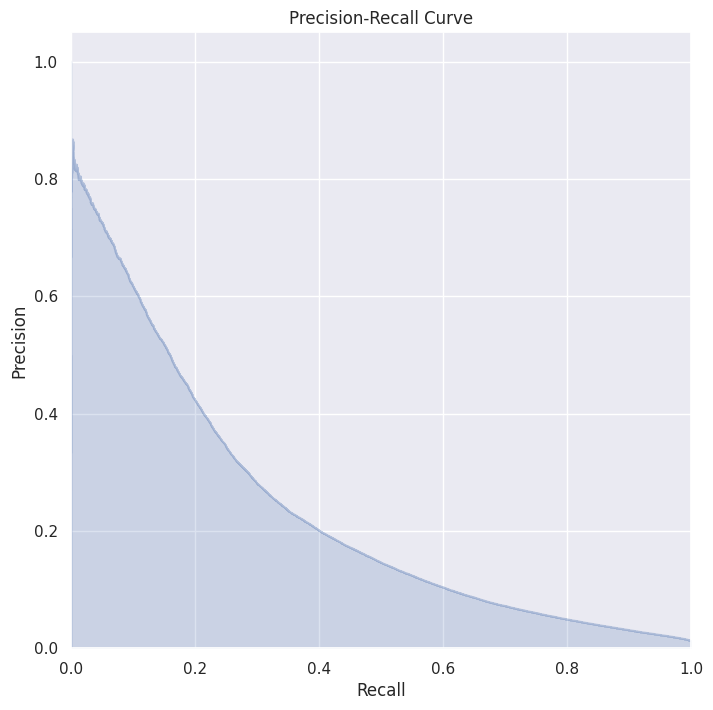

In [59]:
from sklearn.metrics import precision_recall_curve

# Get predicted probabilities for each label
y_scores = clf.decision_function(x_test_W2V)

# Compute precision-recall curve for each label
precision, recall, _ = precision_recall_curve(y_test_mlb.ravel(), y_scores.ravel())

# Plot precision-recall curve for each label
plt.figure(figsize=(8, 8))
plt.step(recall, precision, color='b', alpha=0.2, where='post')
plt.fill_between(recall, precision, step='post', alpha=0.2, color='b')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])
plt.title('Precision-Recall Curve')
plt.show()


Text(0.5, 1.0, 'Micro-average Receiver Operating Characteristic')

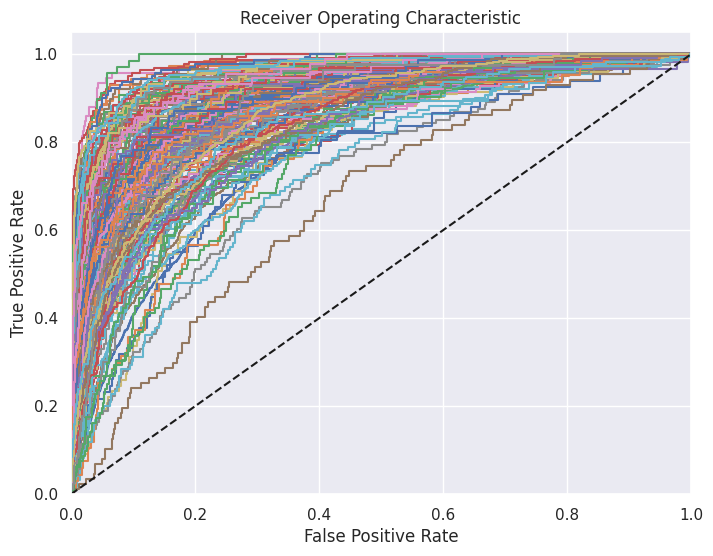

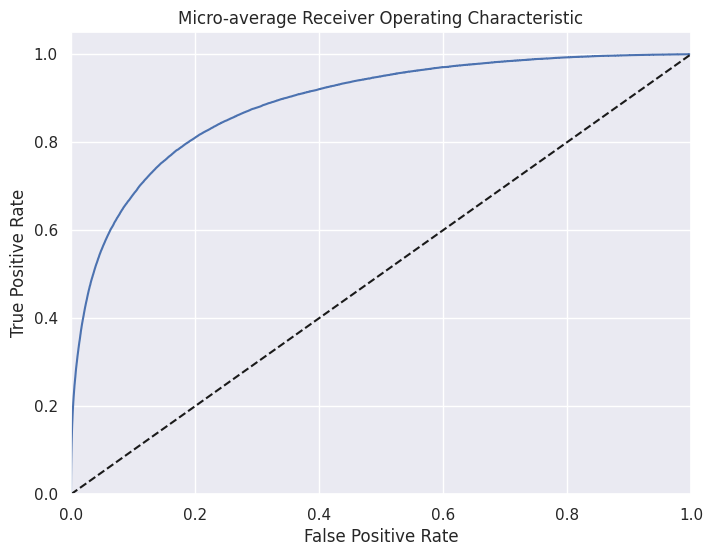

In [60]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier

# Binarize the labels
y_test_bin = label_binarize(y_test_mlb, classes=list(range(len(tags))))

# Get predicted probabilities for each label
y_scores = clf.decision_function(x_test_W2V)

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(len(tags)):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_scores[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
fpr_micro, tpr_micro, _ = roc_curve(y_test_bin.ravel(), y_scores.ravel())
roc_auc_micro = auc(fpr_micro, tpr_micro)

# Plot ROC curve for each class
plt.figure(figsize=(8,6))
for i in range(len(tags)):
    plt.plot(fpr[i], tpr[i], label=f'{tags[i]} (AUC = {roc_auc[i]:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
#plt.legend(loc='lower right')

# Plot micro-average ROC curve
plt.figure(figsize=(8,6))
plt.plot(fpr_micro, tpr_micro, label=f'Micro-average (AUC = {roc_auc_micro:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Micro-average Receiver Operating Characteristic')
#plt.legend(loc='lower right')


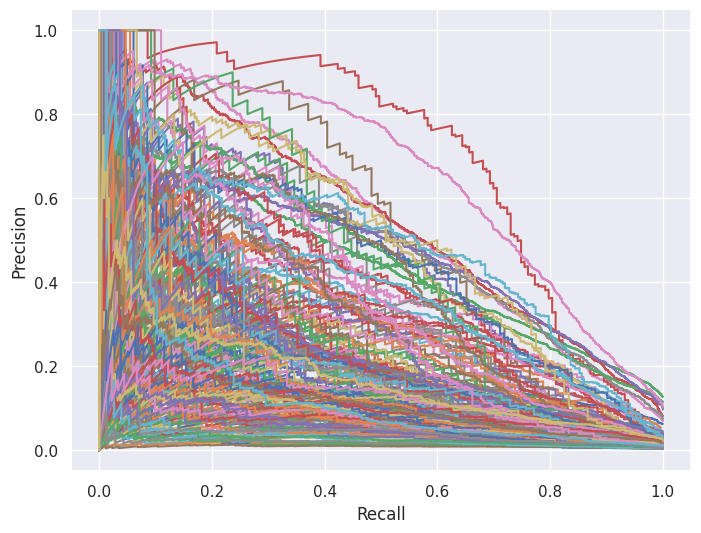

In [61]:
from sklearn.metrics import precision_recall_curve

# Get predicted probabilities for each label
y_scores = clf.decision_function(x_test_W2V)

# Compute precision-recall curve for each label
precision = dict()
recall = dict()
for i in range(len(tags)):
    precision[i], recall[i], _ = precision_recall_curve(y_test_mlb[:, i], y_scores[:, i])

# Plot precision-recall curves for each label
fig, ax = plt.subplots(figsize=(8, 6))
for i in range(len(tags)):
    ax.plot(recall[i], precision[i], label=tags[i])

# Set axis labels and legend
ax.set_xlabel("Recall")
ax.set_ylabel("Precision")
#ax.legend()
ax.grid(True)
plt.show()


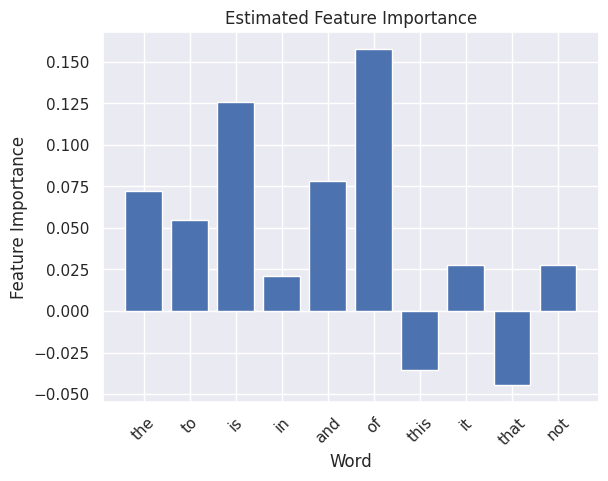

In [63]:
# Plot feature importances
features = model.wv.index_to_key
coefs = clf.estimators_[0].coef_
fig, ax = plt.subplots()
plt.bar(features[:10], coefs[0][:10])
plt.xticks(rotation=45)
plt.xlabel("Word")
plt.ylabel("Feature Importance")
plt.title("Estimated Feature Importance")
plt.show()

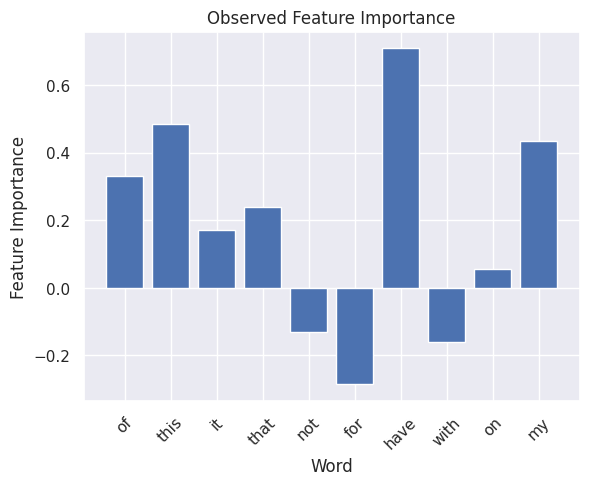

In [64]:
# Plot observed feature importance
observed_features = x_train_W2V.mean(axis=0)
fig, ax = plt.subplots()
plt.bar(features[5:15], observed_features[5:15])
plt.xticks(rotation=45)
plt.xlabel("Word")
plt.ylabel("Feature Importance")
plt.title("Observed Feature Importance")
plt.show()

In [ ]:
import tensorflow as tf
import tensorflow.keras
from tensorflow.keras import backend as K

from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras import metrics as kmetrics
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model
w2v_size=500
w2v_window=5
w2v_min_count=1
w2v_epochs=10
maxlen = 24 # adapt to length of sentences
sentences = X_train["titleandbody"].to_list()
sentences = [gensim.utils.simple_preprocess(text) for text in sentences]

In [ ]:
w2v_size=100
w2v_window=5
w2v_min_count=1
w2v_epochs=10
maxlen = 24 # adapt to length of sentences
sentences = x_train.to_list()
sentences = [gensim.utils.simple_preprocess(text) for text in sentences]

In [ ]:
# Création et entraînement du modèle Word2Vec

print("Build & train Word2Vec model ...")
w2v_model = gensim.models.Word2Vec(min_count=w2v_min_count, window=w2v_window,
                                                vector_size=w2v_size,
                                                seed=42,
                                                workers=1)
#                                                workers=multiprocessing.cpu_count())
w2v_model.build_vocab(sentences)
w2v_model.train(sentences, total_examples=w2v_model.corpus_count, epochs=w2v_epochs)
model_vectors = w2v_model.wv
w2v_words = model_vectors.index_to_key
print("Vocabulary size: %i" % len(w2v_words))
print("Word2Vec trained")

In [ ]:
# Préparation des sentences (tokenization)

print("Fit Tokenizer ...")
tokenizer = Tokenizer()
tokenizer.fit_on_texts(sentences)
x_sentences = pad_sequences(tokenizer.texts_to_sequences(sentences),
                                                     maxlen=maxlen,
                                                     padding='post') 
                                                   
num_words = len(tokenizer.word_index) + 1
print("Number of unique words: %i" % num_words)

In [ ]:
# Création de la matrice d'embedding

print("Create Embedding matrix ...")
w2v_size = 1000
word_index = tokenizer.word_index
vocab_size = len(word_index) + 1
embedding_matrix = np.zeros((vocab_size, w2v_size))
i=0
j=0
    
for word, idx in word_index.items():
    i +=1
    if word in w2v_words:
        j +=1
        embedding_vector = model_vectors[word]
        if embedding_vector is not None:
            embedding_matrix[idx] = model_vectors[word]
            
word_rate = np.round(j/i,4)
print("Word embedding rate : ", word_rate)
print("Embedding matrix: %s" % str(embedding_matrix.shape))

In [ ]:
# Création du modèle

input=Input(shape=(len(x_sentences),maxlen),dtype='float64')
word_input=Input(shape=(maxlen,),dtype='float64')  
word_embedding=Embedding(input_dim=vocab_size,
                         output_dim=w2v_size,
                         weights = [embedding_matrix],
                         input_length=maxlen)(word_input)
word_vec=GlobalAveragePooling1D()(word_embedding)  
embed_model = Model([word_input],word_vec)

embed_model.summary()

In [ ]:
embeddings = embed_model.predict(x_sentences)
embeddings.shape

<a id="imp"></a>
## <span style="font-weight: 1000;font-size: 1.0em">  Universal Sentence Encoder (USE) Embeddings</span>

### OnVsRest Classifier with USE

In [65]:
import tensorflow_hub as hub
# Load the customer review dataset as a pandas dataframe
#df = pd.read_csv('customer_reviews.csv')

# Preprocess the text data by removing stopwords, stemming/lemmatizing the words, and performing other necessary text cleaning operations
# We will use the TextBlob library to perform stemming and lemmatization
from textblob import TextBlob
import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')

stop_words = stopwords.words('english')
#df['cleaned_text'] = df['text'].apply(lambda x: " ".join([i for i in TextBlob(x).words.lemmatize() if i not in stop_words]))

# Encode the preprocessed text data using Universal Sentence Encoder (USE)
module_url = "https://tfhub.dev/google/universal-sentence-encoder/4"
embed = hub.load(module_url)

# Encode the preprocessed text data using Universal Sentence Encoder (USE)
#X = df['cleaned_text']
#y = df['labels']

#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

X_train_encoded = []
for i in range(0, len(x_train), 1000):
    X_train_batch = x_train[i:i+1000].values
    X_train_batch_encoded = embed(X_train_batch)
    X_train_encoded.append(X_train_batch_encoded)

X_train_encoded = np.concatenate(X_train_encoded, axis=0)

X_test_encoded = []
for i in range(0, len(x_test), 1000):
    X_test_batch = x_test[i:i+1000].values
    X_test_batch_encoded = embed(X_test_batch)
    X_test_encoded.append(X_test_batch_encoded)

X_test_encoded = np.concatenate(X_test_encoded, axis=0)




[nltk_data] Downloading package stopwords to /usr/share/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [66]:
USE_model = {                   
                   'Logistic Regression' : LogisticRegression( random_state=42),
                   'Linear SVC': LinearSVC(),
                    #"Ridge Classifier" :  RidgeClassifier(random_state=42),
                    "lgbm Classifier": LGBMClassifier(random_state=42),
                   'SGDClassifier': SGDClassifier(random_state=42),
                    "Passive Aggressive Classifier" : PassiveAggressiveClassifier(random_state=42),
                    "Perceptron" : Perceptron(random_state=42),
                    "Solves linear One-Class SVM" : SGDOneClassSVM(random_state=42)
                  }

In [67]:
Scoring_USE = modelling(USE_model, X_train_encoded,X_test_encoded, y_train_mlb, y_test_mlb)

*****************************************************************************************
                                      Logistic Regression
*****************************************************************************************
precision on train: 0.8055869872701555, and test: 0.7820283406683755
recall score on train: 0.4347156850273502, and test: 0.4192160116146427
fscore score on train: 0.5647029662067257, and test: 0.545831997164509
Jaccard score on train: 0.4255679410206605, and test: 0.40872821680275095
Accuracy score on train: 0.16508034610630407, and test: 0.15145241232197754
Hamming Loss score on train: 0.008140296662546353, and test: 0.00844124474559257
*****************************************************************************************
                                      Linear SVC
*****************************************************************************************
precision on train: 0.834993222935942, and test: 0.7695680953168956
recall score on train:

In [68]:
score_use = pd.DataFrame(Scoring_USE)
score_use

,Logistic Regression,Linear SVC,lgbm Classifier,SGDClassifier,Passive Aggressive Classifier,Perceptron,Solves linear One-Class SVM
Precision,0.782028,0.769568,0.678982,0.823887,0.623470,0.455420,0.0000
Recall,0.419216,0.482267,0.440708,0.347843,0.507026,0.513144,0.0000
Fscore,0.545832,0.592949,0.534493,0.489163,0.559251,0.482562,0.0000
Jaccard,0.408728,0.460021,0.399783,0.363335,0.427196,0.350316,0.0000
Accuracy,0.151452,0.177740,0.128239,0.134638,0.128804,0.057971,0.0000
Hamming Loss,0.008441,0.008012,0.009289,0.008791,0.009670,0.013315,0.0121


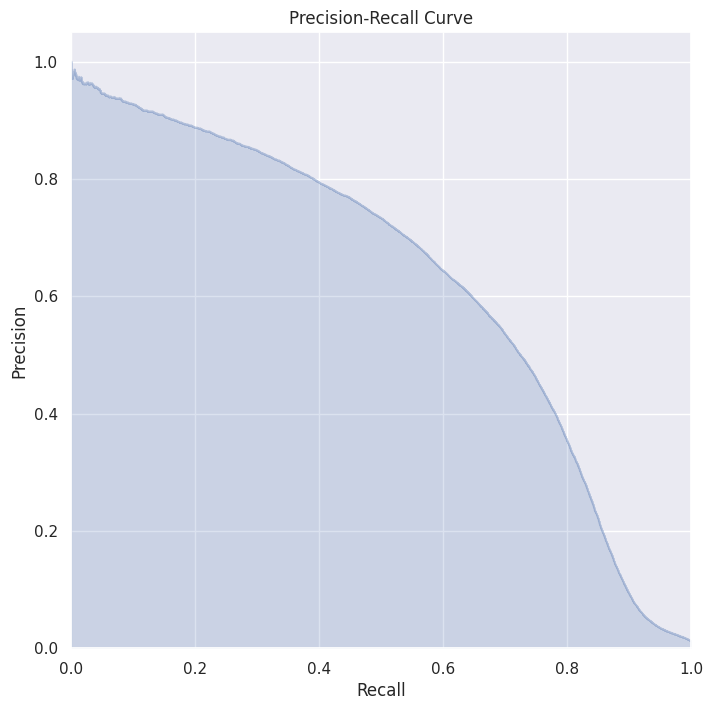

In [69]:
from sklearn.metrics import precision_recall_curve
clf = OneVsRestClassifier(SGDClassifier(random_state=42))
clf.fit(X_train_encoded, y_train_mlb)
# Get predicted probabilities for each label
y_scores = clf.decision_function(X_test_encoded)

# Compute precision-recall curve for each label
precision, recall, _ = precision_recall_curve(y_test_mlb.ravel(), y_scores.ravel())

# Plot precision-recall curve for each label
plt.figure(figsize=(8, 8))
plt.step(recall, precision, color='b', alpha=0.2, where='post')
plt.fill_between(recall, precision, step='post', alpha=0.2, color='b')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])
plt.title('Precision-Recall Curve')
plt.show()


Text(0.5, 1.0, 'Micro-average Receiver Operating Characteristic')

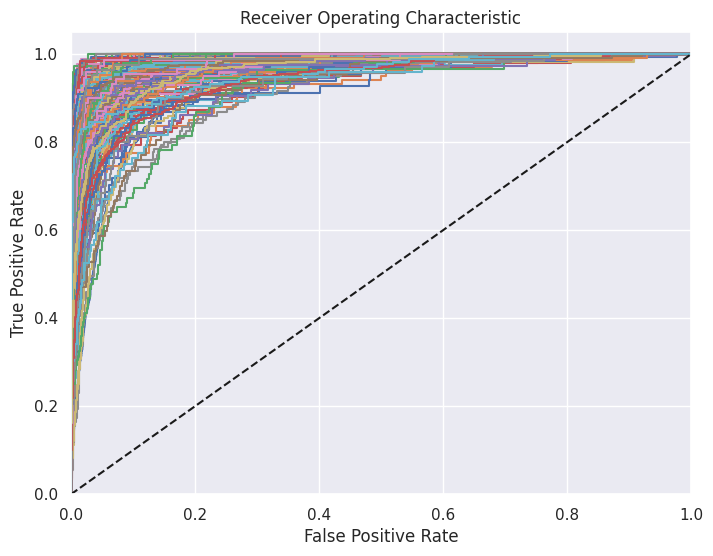

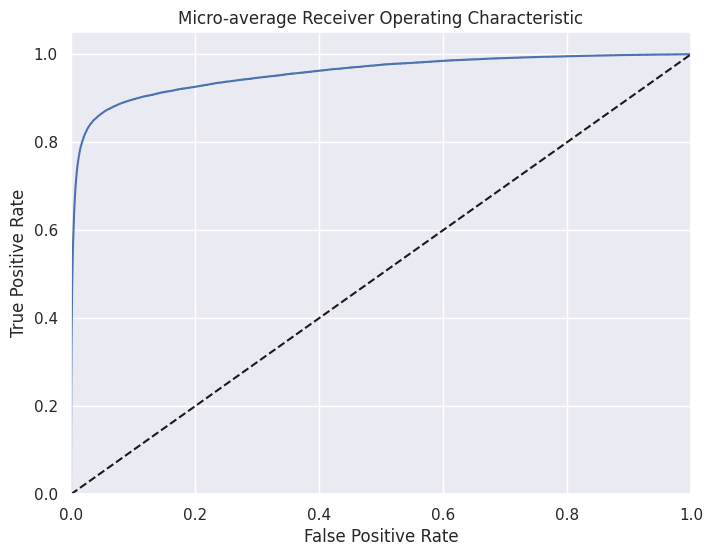

In [70]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier

# Binarize the labels
y_test_bin = label_binarize(y_test_mlb, classes=list(range(len(tags))))

# Get predicted probabilities for each label
y_scores = clf.decision_function(X_test_encoded)

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(len(tags)):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_scores[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
fpr_micro, tpr_micro, _ = roc_curve(y_test_bin.ravel(), y_scores.ravel())
roc_auc_micro = auc(fpr_micro, tpr_micro)

# Plot ROC curve for each class
plt.figure(figsize=(8,6))
for i in range(len(tags)):
    plt.plot(fpr[i], tpr[i], label=f'{tags[i]} (AUC = {roc_auc[i]:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
#plt.legend(loc='lower right')

# Plot micro-average ROC curve
plt.figure(figsize=(8,6))
plt.plot(fpr_micro, tpr_micro, label=f'Micro-average (AUC = {roc_auc_micro:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Micro-average Receiver Operating Characteristic')
#plt.legend(loc='lower right')


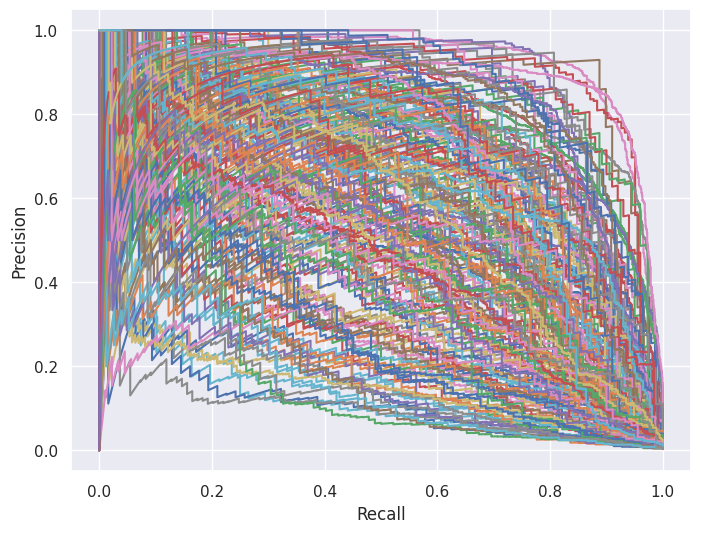

In [71]:
from sklearn.metrics import precision_recall_curve

# Get predicted probabilities for each label
y_scores = clf.decision_function(X_test_encoded)

# Compute precision-recall curve for each label
precision = dict()
recall = dict()
for i in range(len(tags)):
    precision[i], recall[i], _ = precision_recall_curve(y_test_mlb[:, i], y_scores[:, i])

# Plot precision-recall curves for each label
fig, ax = plt.subplots(figsize=(8, 6))
for i in range(len(tags)):
    ax.plot(recall[i], precision[i], label=tags[i])

# Set axis labels and legend
ax.set_xlabel("Recall")
ax.set_ylabel("Precision")
#ax.legend()
ax.grid(True)
plt.show()


### Deep learning with USE

In [11]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.metrics import accuracy_score, jaccard_score
import tensorflow_hub as hub

# Define dataset class
class CustomDataset(Dataset):
    def __init__(self, x_data, y_data):
        """
        Custom dataset class for input and target data.

        Args:
            x_data: Input data.
            y_data: Target data.
        """
        self.x_data = x_data
        self.y_data = y_data
    
    def __len__(self):
        return len(self.x_data)
    
    def __getitem__(self, index):
        x = self.x_data[index]
        y = self.y_data[index]
        return x, y


class USEClassifier(nn.Module):
    def __init__(self, num_classes):
        """
        USEClassifier model for classification.

        Args:
            num_classes: Number of classes for classification.
        """
        super(USEClassifier, self).__init__()
        self.num_classes = num_classes
        self.fc = nn.Linear(512, num_classes)

    def forward(self, embeddings):
        """
        Forward pass of the USEClassifier model.

        Args:
            embeddings: Input embeddings.

        Returns:
            Output predictions.
        """
        return self.fc(embeddings)


def train_model(model, train_loader, criterion, optimizer, device):
    """
    Train the model.

    Args:
        model: Model to train.
        train_loader: Data loader for training data.
        criterion: Loss criterion.
        optimizer: Optimizer for model parameters.
        device: Device to use for training.

    Returns:
        Average loss over the training data.
    """
    model.train()
    total_loss = 0
    for inputs, targets in train_loader:
        optimizer.zero_grad()
        inputs = [sentence.lower() for sentence in inputs]
        embeddings = use_module(inputs).numpy()  # Convert TensorFlow tensor to NumPy array
        embeddings = torch.from_numpy(embeddings).to(device)
        targets = targets.to(device)
        outputs = model(embeddings)  # Pass the embeddings to the model
        loss = criterion(outputs, targets)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(train_loader)


def evaluate_model(model, data_loader):
    """
    Evaluate the model.

    Args:
        model: Model to evaluate.
        data_loader: Data loader for evaluation data.

    Returns:
        Predictions and targets.
    """
    model.eval()
    predictions = []
    targets = []

    with torch.no_grad():
        for inputs, labels in data_loader:
            inputs = [sentence.lower() for sentence in inputs]
            embeddings = use_module(inputs).numpy()  # Convert TensorFlow tensor to NumPy array
            embeddings = torch.from_numpy(embeddings).to(device)
            labels = labels.to(device)
            outputs = model(embeddings)  # Pass the embeddings to the model
            predicted_labels = torch.sigmoid(outputs) > 0.4
            predictions.extend(predicted_labels.cpu().tolist())
            targets.extend(labels.cpu().tolist())

    return predictions, targets

# Load data into pandas DataFrame
x_train = X_train["Title"] + " " + X_train["Body"]
x_test = X_test["Title"] + " " + X_test["Body"]
y_test = Y_test.head(7000)
x_train_reduce = x_train.head(25000)
x_test = x_test.head(7000)
Y_train_reduce = Y_train.head(25000)

# Split data into train and validation sets
x_train, x_val, y_train, y_val = train_test_split(x_train_reduce, Y_train_reduce, test_size=0.2, random_state=42)

x_train.reset_index(drop=True, inplace=True)
x_test.reset_index(drop=True, inplace=True)
x_val.reset_index(drop=True, inplace=True)
y_train.reset_index(drop=True, inplace=True)
y_val.reset_index(drop=True, inplace=True)
y_test.reset_index(drop=True, inplace=True)

# Encode labels
mlb = MultiLabelBinarizer()
Y_train_encoded = mlb.fit_transform(y_train)
Y_test_encoded = mlb.transform(y_test)
Y_val_encoded = mlb.transform(y_val)

# Convert labels to tensors
y_train = torch.FloatTensor(Y_train_encoded)
y_val = torch.FloatTensor(Y_val_encoded)
y_test = torch.FloatTensor(Y_test_encoded)

# Create custom datasets
train_dataset = CustomDataset(x_train, y_train)
val_dataset = CustomDataset(x_val, y_val)
test_dataset = CustomDataset(x_test, y_test)

# Create data loaders
batch_size = 32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size)
test_loader = DataLoader(test_dataset, batch_size=batch_size)

# Initialize the model
num_classes = y_train.shape[1]
model = USEClassifier(num_classes)

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Check if multiple GPUs are available
if torch.cuda.device_count() > 1:
    print(f"Using {torch.cuda.device_count()} GPUs for training.")
    model = nn.DataParallel(model)  # Wrap the model with DataParallel

model.to(device)  # Move the model to the selected device

# Load the Universal Sentence Encoder (USE) module
use_module = hub.load("https://tfhub.dev/google/universal-sentence-encoder/4")



# Define loss function and optimizer
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Training loop
num_epochs = 60
best_val_loss = float('inf')

for epoch in range(num_epochs):
    train_loss = train_model(model, train_loader, criterion, optimizer, device)  # Pass 'device' to the train_model function
    val_predictions, val_targets = evaluate_model(model, val_loader)
    
    # Convert boolean tensors to float tensors
    val_predictions = torch.tensor(val_predictions, dtype=torch.float32).to(device)
    val_targets = torch.tensor(val_targets, dtype=torch.float32).to(device)
    
    val_loss = criterion(val_predictions, val_targets)
    val_acc = accuracy_score(val_targets.cpu().numpy(), val_predictions.cpu().numpy())
    val_jaccard = jaccard_score(val_targets.cpu().numpy(), val_predictions.cpu().numpy(), average='samples')
    
    print(f"Epoch {epoch+1}/{num_epochs}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, Val Accuracy: {val_acc:.4f}, Val Jaccard Score: {val_jaccard:.4f}")

Using 2 GPUs for training.
Epoch 1/60, Train Loss: 0.2403, Val Loss: 0.6931, Val Accuracy: 0.0014, Val Jaccard Score: 0.0064
Epoch 2/60, Train Loss: 0.0741, Val Loss: 0.6929, Val Accuracy: 0.0264, Val Jaccard Score: 0.0921
Epoch 3/60, Train Loss: 0.0536, Val Loss: 0.6928, Val Accuracy: 0.0452, Val Jaccard Score: 0.1621
Epoch 4/60, Train Loss: 0.0453, Val Loss: 0.6927, Val Accuracy: 0.0590, Val Jaccard Score: 0.2092
Epoch 5/60, Train Loss: 0.0404, Val Loss: 0.6926, Val Accuracy: 0.0724, Val Jaccard Score: 0.2479
Epoch 6/60, Train Loss: 0.0368, Val Loss: 0.6926, Val Accuracy: 0.0840, Val Jaccard Score: 0.2779
Epoch 7/60, Train Loss: 0.0342, Val Loss: 0.6925, Val Accuracy: 0.0956, Val Jaccard Score: 0.3037
Epoch 8/60, Train Loss: 0.0321, Val Loss: 0.6925, Val Accuracy: 0.1070, Val Jaccard Score: 0.3276
Epoch 9/60, Train Loss: 0.0305, Val Loss: 0.6925, Val Accuracy: 0.1126, Val Jaccard Score: 0.3450
Epoch 10/60, Train Loss: 0.0293, Val Loss: 0.6925, Val Accuracy: 0.1184, Val Jaccard Score:

In [12]:
test_predictions, test_targets = evaluate_model(model, test_loader)

# Convert boolean tensors to float tensors
test_predictions = torch.tensor(test_predictions, dtype=torch.float32).to(device)
test_targets = torch.tensor(test_targets, dtype=torch.float32).to(device)

test_loss = criterion(test_predictions, test_targets)
test_acc = accuracy_score(test_targets.cpu().numpy(), test_predictions.cpu().numpy())
test_jaccard = jaccard_score(test_targets.cpu().numpy(), test_predictions.cpu().numpy(), average='samples')

print("Test Loss: {:.4f}".format(test_loss.item()))
print("Test Accuracy: {:.4f}".format(test_acc))
print("Test Jaccard Score: {:.4f}".format(test_jaccard))


Test Loss: 0.6924
Test Accuracy: 0.1656
Test Jaccard Score: 0.4713


In [15]:
test_predictions

tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]], device='cuda:0')

In [16]:
import torch
from sklearn.metrics import multilabel_confusion_matrix

# Convert boolean predictions to integer labels
test_predictions = test_predictions.to(device)
test_targets = test_targets.to(device)

# Round the predictions to obtain integer labels
rounded_predictions = torch.round(test_predictions).cpu().numpy().astype(int)
rounded_targets = test_targets.cpu().numpy().astype(int)

# Compute the multilabel confusion matrix
mcm = multilabel_confusion_matrix(rounded_targets, rounded_predictions)

print("Multilabel Confusion Matrix:")
print(mcm)

Multilabel Confusion Matrix:
[[[6416  146]
  [ 267  171]]

 [[6974    5]
  [  19    2]]

 [[6901   18]
  [  36   45]]

 [[6869   19]
  [  51   61]]

 [[6968    4]
  [   7   21]]

 [[6940   15]
  [  19   26]]

 [[6481   42]
  [  59  418]]

 [[6966    6]
  [  20    8]]

 [[6948    7]
  [  23   22]]

 [[6927    4]
  [  31   38]]

 [[6914   15]
  [  32   39]]

 [[6945    7]
  [  21   27]]

 [[6959    3]
  [  16   22]]

 [[6954    6]
  [  34    6]]

 [[6862   34]
  [  41   63]]

 [[6753   63]
  [ 102   82]]

 [[6949   10]
  [  27   14]]

 [[6853   31]
  [  58   58]]

 [[6966    7]
  [  22    5]]

 [[6966    7]
  [  26    1]]

 [[6954    9]
  [  26   11]]

 [[6942   11]
  [  23   24]]

 [[6959    4]
  [  20   17]]

 [[6935   11]
  [  45    9]]

 [[6955    9]
  [  15   21]]

 [[6914   28]
  [  38   20]]

 [[6969    5]
  [   6   20]]

 [[6928   17]
  [  31   24]]

 [[6977    2]
  [  17    4]]

 [[6959    8]
  [  31    2]]

 [[6975    6]
  [  19    0]]

 [[6694   75]
  [ 126  105]]

 [[5847  23

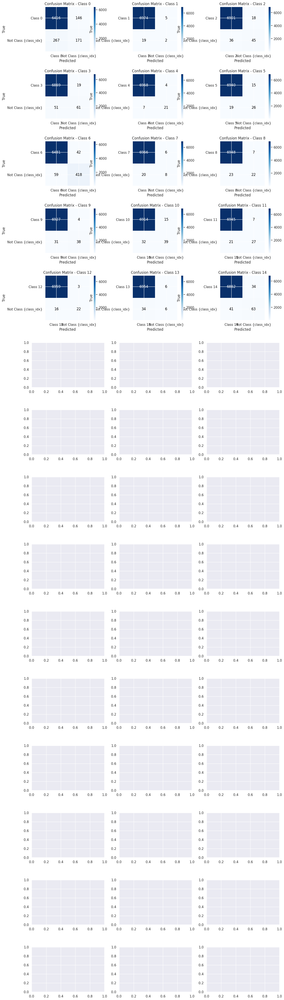

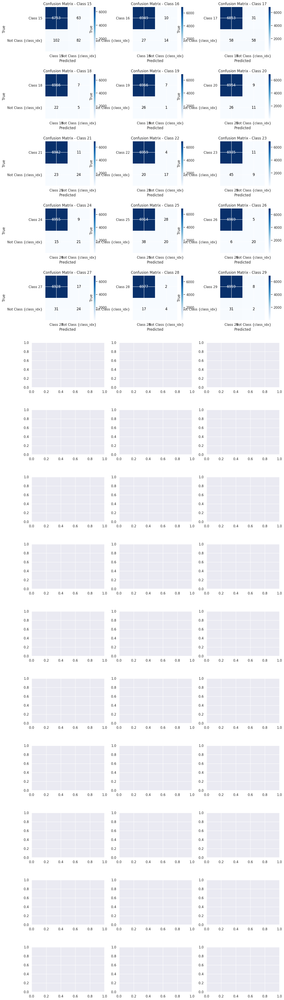

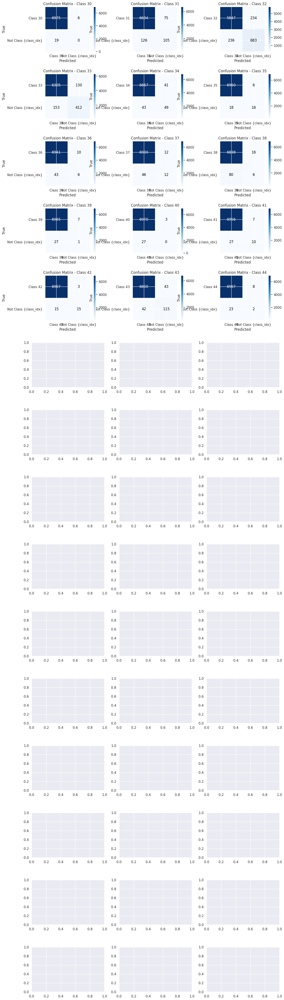

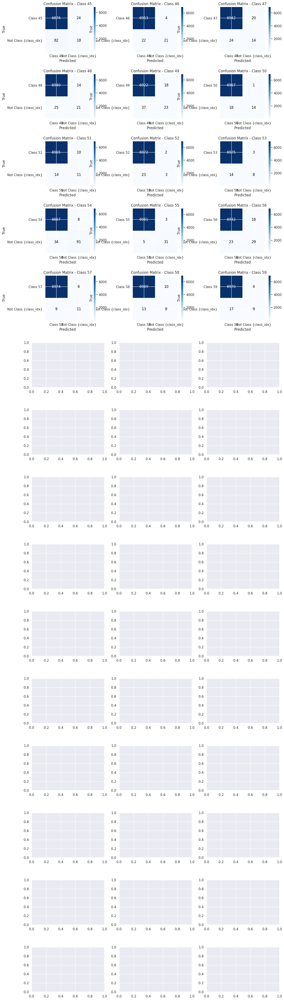

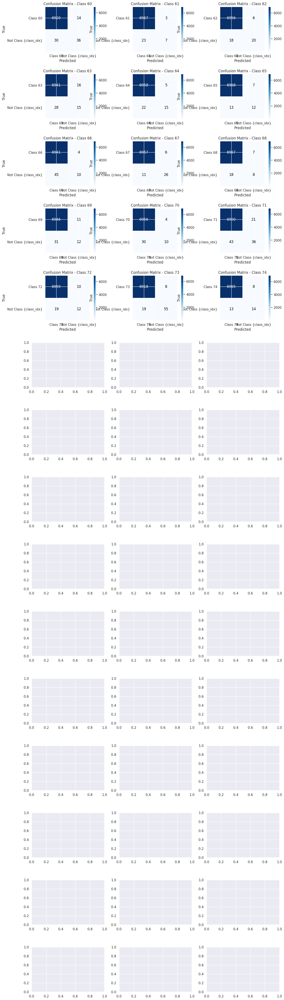

...

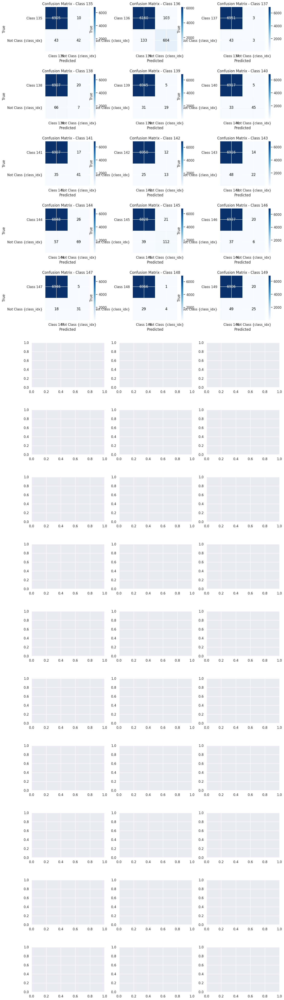

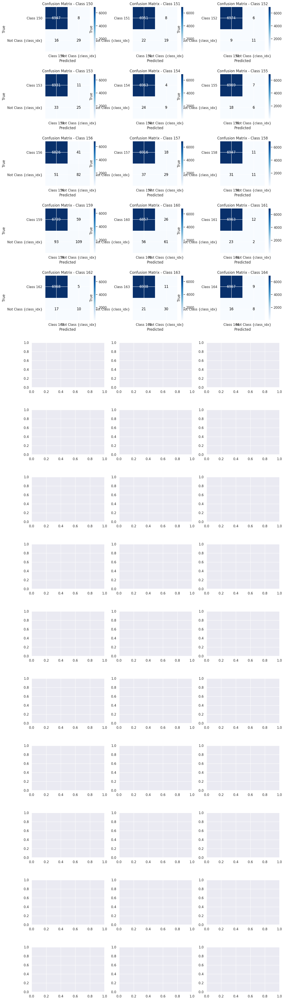

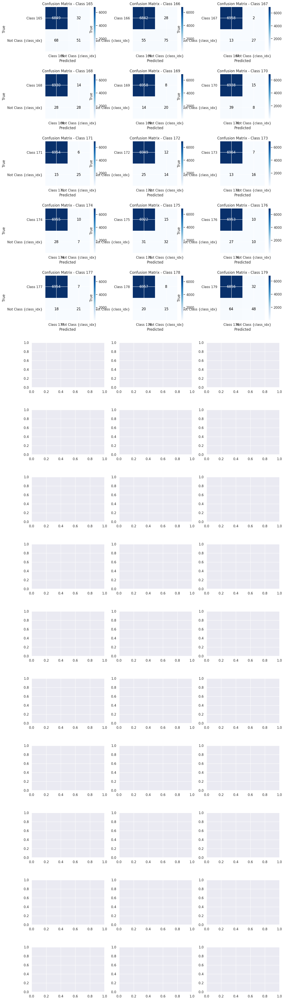

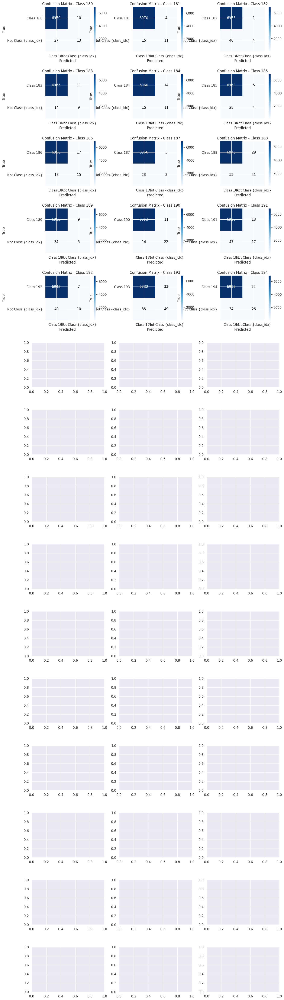

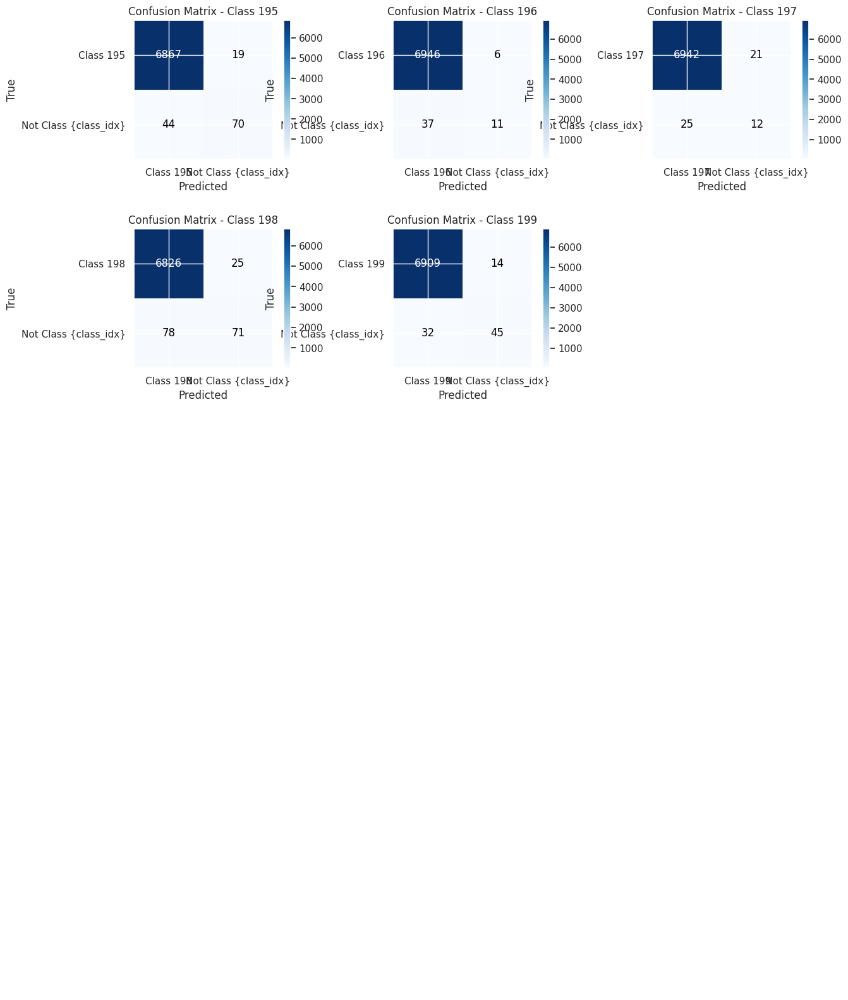

In [17]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import multilabel_confusion_matrix

# Compute the multilabel confusion matrix
mcm = multilabel_confusion_matrix(rounded_targets, rounded_predictions)

# Get the number of classes
num_classes = mcm.shape[0]

# Define the number of subplots to display at a time
subplots_per_page = 15

# Calculate the number of pages required
num_pages = int(np.ceil(num_classes / subplots_per_page))

# Calculate the number of rows and columns for the subplots
num_rows = min(subplots_per_page, num_classes)
num_cols = min(3, num_classes)

# Create a figure with a scrollable grid of subplots
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(15, 4 * num_rows))
plt.subplots_adjust(hspace=0.5)  # Adjust the vertical spacing between subplots

# Iterate over the pages
for page in range(num_pages):
    # Calculate the range of classes to display on the current page
    start = page * subplots_per_page
    end = min(start + subplots_per_page, num_classes)

    # Plot the confusion matrices for the current page
    for i, class_idx in enumerate(range(start, end)):
        row_idx = i // num_cols
        col_idx = i % num_cols
        ax = axes[row_idx, col_idx] if num_rows > 1 else axes[col_idx]  # Handle single subplot case
        cm = mcm[class_idx]
        labels = [f'Class {class_idx}', 'Not Class {class_idx}']

        # Plot the confusion matrix
        im = ax.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
        ax.figure.colorbar(im, ax=ax)

        # Add labels and title
        ax.set(xticks=np.arange(cm.shape[1]),
               yticks=np.arange(cm.shape[0]),
               xticklabels=labels, yticklabels=labels,
               xlabel='Predicted', ylabel='True',
               title=f'Confusion Matrix - Class {class_idx}')

        # Annotate the confusion matrix cells
        fmt = '.2f' if cm.dtype == np.float64 else 'd'
        thresh = cm.max() / 2.
        for r in range(cm.shape[0]):
            for c in range(cm.shape[1]):
                ax.text(c, r, format(cm[r, c], fmt),
                        ha="center", va="center",
                        color="white" if cm[r, c] > thresh else "black")

    # Hide empty subplots on the last page if necessary
    if end - start < subplots_per_page:
        for i in range(end - start, subplots_per_page):
            row_idx = i // num_cols
            col_idx = i % num_cols
            ax = axes[row_idx, col_idx] if num_rows > 1 else axes[col_idx]
            ax.axis('off')

    # Show the current page of subplots
    plt.show()

    # Create a new figure for the next page, except for the last page
    if page < num_pages - 1:
        num_rows = min(subplots_per_page, num_classes - (page + 1) * subplots_per_page)
        fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(15, 4 * num_rows))
        plt.subplots_adjust(hspace=0.5)  # Adjust the vertical spacing between subplots

<a id="imp"></a>
## <span style="font-weight: 1000;font-size: 1.0em"> Bidirectional Encoder Representations from Transformers (BERT) Embeddings</span>

In [14]:
from transformers import TFBertModel, BertTokenizer

tokenizer = BertTokenizer.from_pretrained('distilbert-base-uncased')

def tokenize_text(text):
    return tokenizer.encode_plus(text, add_special_tokens=True, max_length=1000, pad_to_max_length=True, return_attention_mask=True, return_token_type_ids=True, truncation=True)

# Load data into pandas DataFrame
x_train = X_train["Title"] + " " + X_train["Body"]
x_test = X_test["Title"] + " " + X_test["Body"]
x_train_bert = np.array([tokenize_text(text)['input_ids'] for text in x_train])
x_test_bert = np.array([tokenize_text(text)['input_ids'] for text in x_test])



The tokenizer class you load from this checkpoint is not the same type as the class this function is called from. It may result in unexpected tokenization. 
The tokenizer class you load from this checkpoint is 'DistilBertTokenizer'. 
The class this function is called from is 'BertTokenizer'.


In [19]:
BERT_model = {                   
                   'Logistic Regression' : LogisticRegression( random_state=42),
                   'Linear SVC': LinearSVC(),
                    #"Ridge Classifier" :  RidgeClassifier(random_state=42),
                    "lgbm Classifier": LGBMClassifier(random_state=42),
                   'SGDClassifier': SGDClassifier(random_state=42),
                    "Passive Aggressive Classifier" : PassiveAggressiveClassifier(random_state=42),
                    "Perceptron" : Perceptron(random_state=42),
                    "Solves linear One-Class SVM" : SGDOneClassSVM(random_state=42)
                  }

In [22]:
Scoring_BERT= modelling(BERT_model, x_train_bert,x_test_bert, y_train_mlb, y_test_mlb)

*****************************************************************************************
                                      Logistic Regression
*****************************************************************************************
precision on train: 0.9394607302916759, and test: 0.01560410164957646
recall score on train: 0.16266378323368527, and test: 0.00725915171627087
fscore score on train: 0.2773121089556608, and test: 0.009908698421685895
Jaccard score on train: 0.15289245982694685, and test: 0.00356607993979148
Accuracy score on train: 0.06282447466007417, and test: 0.00012547838634795156
Hamming Loss score on train: 0.01029774412855377, and test: 0.017553171466214944
*****************************************************************************************
                                      Linear SVC
*****************************************************************************************
precision on train: 0.1492426071529797, and test: 0.030619991564740615
recall sc

In [23]:
score_bert = pd.DataFrame(Scoring_BERT)
score_bert

,Logistic Regression,Linear SVC,lgbm Classifier,SGDClassifier,Passive Aggressive Classifier,Perceptron,Solves linear One-Class SVM
Precision,0.015604,0.030620,0.688179,0.037538,0.045317,0.035487,0.01210
Recall,0.007259,0.047055,0.057503,0.041403,0.044722,0.037825,1.00000
Fscore,0.009909,0.037099,0.106137,0.039376,0.045017,0.036619,0.02391
Jaccard,0.003566,0.018808,0.062220,0.022867,0.023600,0.020260,0.01210
Accuracy,0.000125,0.000439,0.018822,0.001631,0.000753,0.000502,0.00000
Hamming Loss,0.017553,0.029555,0.011719,0.024444,0.022958,0.024082,0.98790


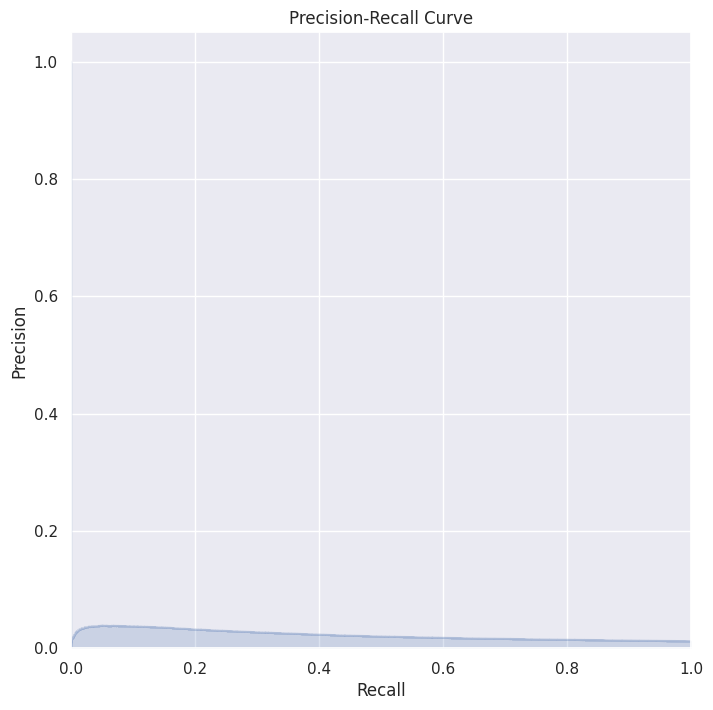

In [15]:
from sklearn.metrics import precision_recall_curve
clf = OneVsRestClassifier(SGDClassifier(random_state=42))
clf.fit(x_train_bert, y_train_mlb)
# Get predicted probabilities for each label
y_scores = clf.decision_function(x_test_bert)

# Compute precision-recall curve for each label
precision, recall, _ = precision_recall_curve(y_test_mlb.ravel(), y_scores.ravel())

# Plot precision-recall curve for each label
plt.figure(figsize=(8, 8))
plt.step(recall, precision, color='b', alpha=0.2, where='post')
plt.fill_between(recall, precision, step='post', alpha=0.2, color='b')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])
plt.title('Precision-Recall Curve')
plt.show()


Text(0.5, 1.0, 'Micro-average Receiver Operating Characteristic')

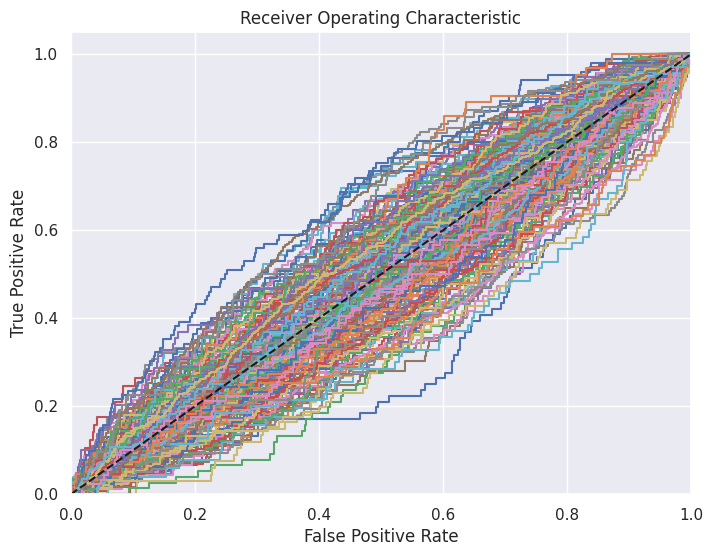

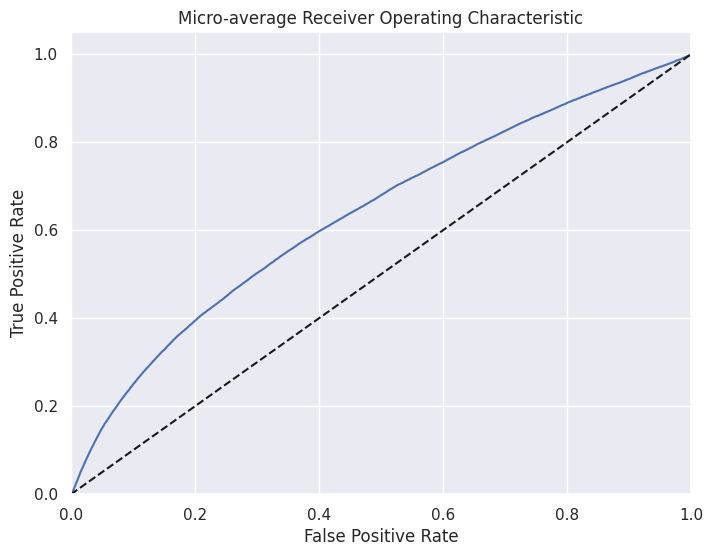

In [17]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

# Binarize the labels
y_test_bin = label_binarize(y_test_mlb, classes=list(range(len(tags))))

# Get predicted probabilities for each label
y_scores = clf.decision_function(x_test_bert)

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(len(tags)):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_scores[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
fpr_micro, tpr_micro, _ = roc_curve(y_test_bin.ravel(), y_scores.ravel())
roc_auc_micro = auc(fpr_micro, tpr_micro)

# Plot ROC curve for each class
plt.figure(figsize=(8,6))
for i in range(len(tags)):
    plt.plot(fpr[i], tpr[i], label=f'{tags[i]} (AUC = {roc_auc[i]:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
#plt.legend(loc='lower right')

# Plot micro-average ROC curve
plt.figure(figsize=(8,6))
plt.plot(fpr_micro, tpr_micro, label=f'Micro-average (AUC = {roc_auc_micro:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Micro-average Receiver Operating Characteristic')
#plt.legend(loc='lower right')


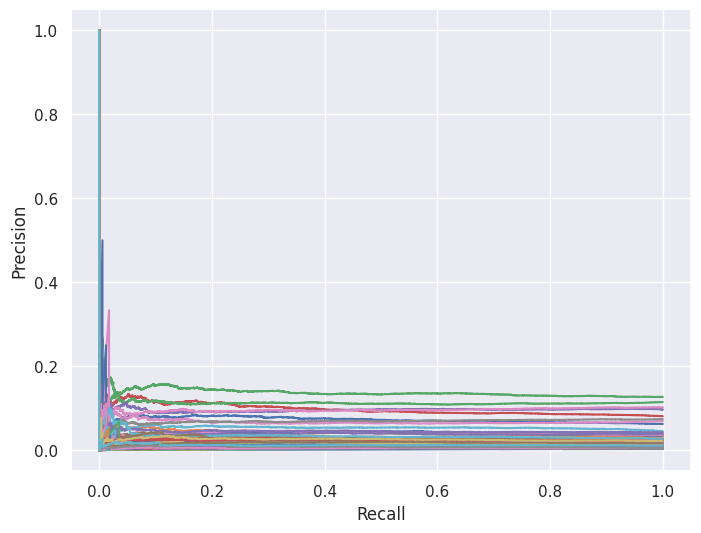

In [18]:
from sklearn.metrics import precision_recall_curve

# Get predicted probabilities for each label
y_scores = clf.decision_function(x_test_bert)

# Compute precision-recall curve for each label
precision = dict()
recall = dict()
for i in range(len(tags)):
    precision[i], recall[i], _ = precision_recall_curve(y_test_mlb[:, i], y_scores[:, i])

# Plot precision-recall curves for each label
fig, ax = plt.subplots(figsize=(8, 6))
for i in range(len(tags)):
    ax.plot(recall[i], precision[i], label=tags[i])

# Set axis labels and legend
ax.set_xlabel("Recall")
ax.set_ylabel("Precision")
#ax.legend()
ax.grid(True)
plt.show()


## BERT Deep Learning

In [ ]:
# Load data into pandas DataFrame
x_train = X_train["Title"] + " " + X_train["Body"]
x_test = X_test["Title"] + " " + X_test["Body"]
y_test = Y_test.head(500)
x_train = x_train.head(25000)
x_test = x_test.head(500)
Y_train_reduce = Y_train.head(25000)

# Encode labels
mlb = MultiLabelBinarizer()
Y_train_encoded = mlb.fit_transform(Y_train_reduce)
Y_test_encoded = mlb.transform(y_test)

In [19]:
import torch
from torch.utils.data import Dataset, DataLoader
from transformers import BertTokenizer, BertForSequenceClassification

class CustomDataset(Dataset):
    def __init__(self, texts, labels, tokenizer, max_length):
        """
        Custom dataset for text classification.

        Args:
            texts (list): List of input texts.
            labels (list): List of corresponding labels.
            tokenizer: Tokenizer used for tokenizing the texts.
            max_length (int): Maximum length of the tokenized inputs.
        """
        self.texts = texts
        self.labels = labels
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        text = str(self.texts[idx])
        label = self.labels[idx]

        encoding = self.tokenizer.encode_plus(
            text,
            add_special_tokens=True,
            max_length=self.max_length,
            padding='max_length',
            truncation=True,
            return_tensors='pt'
        )

        input_ids = encoding['input_ids'].squeeze()
        attention_mask = encoding['attention_mask'].squeeze()

        return {
            'input_ids': input_ids,
            'attention_mask': attention_mask,
            'labels': torch.tensor(label, dtype=torch.float32)
        }


def train(model, data_loader, loss_fn, optimizer, device):
    """
    Training loop for the model.

    Args:
        model: The model to be trained.
        data_loader: DataLoader for loading the training data.
        loss_fn: Loss function to calculate the loss.
        optimizer: Optimizer for updating the model's parameters.
        device: Device (CPU or GPU) on which the model and data reside.

    Returns:
        Average loss over the training data.
    """
    model.train()
    total_loss = 0.0

    for batch in data_loader:
        input_ids = batch['input_ids'].to(device)
        attention_mask = batch['attention_mask'].to(device)
        labels = batch['labels'].to(device)

        optimizer.zero_grad()

        outputs = model(input_ids, attention_mask=attention_mask, labels=labels)
        loss = outputs.loss
        logits = outputs.logits

        total_loss += loss.item()

        loss.backward()
        optimizer.step()

    return total_loss / len(data_loader)


def evaluate(model, data_loader, device):
    """
    Evaluation function for the model.

    Args:
        model: The trained model.
        data_loader: DataLoader for loading the evaluation data.
        device: Device (CPU or GPU) on which the model and data reside.

    Returns:
        Tuple of predictions and true labels.
    """
    model.eval()
    predictions = []
    true_labels = []

    with torch.no_grad():
        for batch in data_loader:
            input_ids = batch['input_ids'].to(device)
            attention_mask = batch['attention_mask'].to(device)
            labels = batch['labels'].to(device)

            outputs = model(input_ids, attention_mask=attention_mask)
            logits = outputs.logits

            predictions.extend(torch.sigmoid(logits).cpu().detach().numpy())
            true_labels.extend(labels.cpu().detach().numpy())

    predictions = (np.array(predictions) > 0.5).astype(int)

    return predictions, true_labels


# Load data into pandas DataFrame
x_train = X_train["Title"] + " " + X_train["Body"]
x_test = X_test["Title"] + " " + X_test["Body"]
y_test = Y_test.head(7000)
x_train_reduce = x_train.head(25000)
x_test = x_test.head(7000)
Y_train_reduce = Y_train.head(25000)

# Split data into train and validation sets
x_train, x_val, y_train, y_val = train_test_split(x_train_reduce, Y_train_reduce, test_size=0.2, random_state=42)

x_train.reset_index(drop=True, inplace=True)
x_test.reset_index(drop=True, inplace=True)
x_val.reset_index(drop=True, inplace=True)
y_train.reset_index(drop=True, inplace=True)
y_val.reset_index(drop=True, inplace=True)
y_test.reset_index(drop=True, inplace=True)

# Encode labels
mlb = MultiLabelBinarizer()
Y_train_encoded = mlb.fit_transform(y_train)
Y_test_encoded = mlb.transform(y_test)
Y_val_encoded = mlb.transform(y_val)

# Define the BERT model and tokenizer
model_name = 'bert-base-uncased'
tokenizer = BertTokenizer.from_pretrained(model_name)
num_labels = Y_train_encoded.shape[1]  # Get the number of labels  # Get the number of unique labels
model = BertForSequenceClassification.from_pretrained(model_name, num_labels=num_labels)

# Set device (GPU if available)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Set the model to the device
model = model.to(device)

# Define the maximum sequence length and batch size
max_length = 128
batch_size = 16

# Create the datasets
train_dataset = CustomDataset(x_train, Y_train_encoded, tokenizer, max_length)
val_dataset = CustomDataset(x_val, Y_val_encoded, tokenizer, max_length)
test_dataset = CustomDataset(x_test, Y_test_encoded, tokenizer, max_length)

# Create the data loaders
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size)
test_loader = DataLoader(test_dataset, batch_size=batch_size)

# Define the optimizer and loss function
optimizer = torch.optim.Adam(model.parameters(), lr=2e-5)
loss_fn = torch.nn.BCEWithLogitsLoss()

# Training loop
num_epochs = 20

for epoch in range(num_epochs):
    train_loss = train(model, train_loader, loss_fn, optimizer, device)
    val_preds, val_labels = evaluate(model, val_loader, device)

    val_accuracy = accuracy_score(val_labels, val_preds)
    val_jaccard = jaccard_score(val_labels, val_preds, average='samples')

    print(f'Epoch {epoch + 1}/{num_epochs} - Loss: {train_loss:.4f} - Val Accuracy: {val_accuracy:.4f} - Val Jaccard: {val_jaccard:.4f}')

Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertForSequenceClassification: ['cls.predictions.decoder.weight', 'cls.seq_relationship.bias', 'cls.seq_relationship.weight', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.bias']
- This IS expected if you are initializing BertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of BertForSequenceClassification were not initialized from the model checkpoint at

Epoch 1/20 - Loss: 0.1034 - Val Accuracy: 0.0000 - Val Jaccard: 0.0000
Epoch 2/20 - Loss: 0.0587 - Val Accuracy: 0.0000 - Val Jaccard: 0.0000
Epoch 3/20 - Loss: 0.0537 - Val Accuracy: 0.0446 - Val Jaccard: 0.1796
Epoch 4/20 - Loss: 0.0439 - Val Accuracy: 0.0742 - Val Jaccard: 0.2436
Epoch 5/20 - Loss: 0.0380 - Val Accuracy: 0.0976 - Val Jaccard: 0.3073
Epoch 6/20 - Loss: 0.0336 - Val Accuracy: 0.1118 - Val Jaccard: 0.3408
Epoch 7/20 - Loss: 0.0301 - Val Accuracy: 0.1276 - Val Jaccard: 0.3694
Epoch 8/20 - Loss: 0.0271 - Val Accuracy: 0.1522 - Val Jaccard: 0.4088
Epoch 9/20 - Loss: 0.0244 - Val Accuracy: 0.1624 - Val Jaccard: 0.4303
Epoch 10/20 - Loss: 0.0220 - Val Accuracy: 0.1702 - Val Jaccard: 0.4408
Epoch 11/20 - Loss: 0.0198 - Val Accuracy: 0.1796 - Val Jaccard: 0.4695
Epoch 12/20 - Loss: 0.0179 - Val Accuracy: 0.1882 - Val Jaccard: 0.4804
Epoch 13/20 - Loss: 0.0162 - Val Accuracy: 0.1866 - Val Jaccard: 0.4835
Epoch 14/20 - Loss: 0.0147 - Val Accuracy: 0.1900 - Val Jaccard: 0.4888
E

In [20]:
# Evaluation on the test set
test_preds, test_labels = evaluate(model, test_loader, device)
test_accuracy = accuracy_score(test_labels, test_preds)
test_jaccard = jaccard_score(test_labels, test_preds, average='samples')

print(f'Test Accuracy: {test_accuracy:.4f}')
print(f'Test Jaccard: {test_jaccard:.4f}')


Test Accuracy: 0.2086
Test Jaccard: 0.5210


In [21]:
# Save the trained model
model_save_path = "/kaggle/working/model.pth"
torch.save(model.state_dict(), model_save_path)


In [33]:
import joblib
# Save the tokenizer and label encoder
tokenizer_save_path = "/kaggle/working/"
mlb_save_path = "/kaggle/working/multilabelbinarizer.pkl"
tokenizer.save_pretrained(tokenizer_save_path)
joblib.dump(mlb, mlb_save_path)

['/kaggle/working/multilabelbinarizer.pkl']

# Bibliographie

**Jens Albrecht, Sidharth Ramachandran, and Christian Winkler (2021)**, *Blueprints for Text Analytics Using Python*

**Chris McCormick and Nick Ryan. (2019, May 14).** *BERT Word Embeddings Tutorial.* Retrieved from http://www.mccormickml.com